# Assignment B - The Harry Potter Universe

## 1) Motivation:

The dataset, that we wanted to analyse are all the seven books of the Harry Potter series, and the transcript for all eight movies. We are also gonna use the data from the fanbase wikipedia of Harry Potter ( http://harrypotter.wikia.com/wiki/Main_Page ).

We wanted to use the content of the book, as we think it could be interesting to see how the mood changes through each books. The transcript can be use to see which characters appear in which scene and see how often the same characters appear each time or together in the same scene. By using the fanbase wikipedia site, we can easily get information about everything from the Harry Potter universe, such as which characters belongs to which house, the characters relationships between each other and so much more.

For our goal, we wanted to show the user how the characters appeared in the movies, look at the relations between them and see which communities they belongs to. This could make the user be able to browse through the information and discover new relations or groups that may not have been obvious from the movies. We also wanted to view which word seems to be more important than other comparing through all the books and see if the words capture the essence of each books. We may think that some of the books are less “happy” than the others.




## 2) Basic stats:

**The Books**

We have all seven Harry Potter books merge together in one PDF file, and convert it to a text file, so we could easily work on it. Though Python, we split the file into seven pieces by manually checking and splitting, when a new book begins. 

**The Movie Transcripts**

By the transcripts, we converted them from a pdf-file to text-file, and divided each scene manuelt by writing “_START OF NEW SCENE_ “, so it will be easier to split up later. We later found out, that the transcript for the fifth movie we found, was not the transcript, used for this movie. We could still find the subtitles for the movie online, but it didn't show who was saying what. One of the group members volunteered to see the fifth Harry Potter movie and manually wrote down each character for lines, that appeared in the subtitles and split up the scenes.

From the start, we tried to split up the scenes by using regex, but because of the different structures of each script, it wouldn't work as we expected and got really complicated, so that's why we decided to manuelt split the scenes up by writing it in the transcript.

**The Wikia Fanbase**

We have a datafile that list all the characters names, where we can mapped both the first and last name to look up these characters, if only one of the names are used in the transcript. By the list of all the characters names, we then look up at the datadump from the wikia fanbase, and looking after the page, that match with the name of the character in our list. We then use the datafile to go through the list to make sure, the right names appear as we wanted to, because some characters are not in movies as in the books.   

Most of each wikia pages have a info-box, which contain alot of information like, the name, bloodstatus, school, etc. To get the information about the bloodstatus, we used regex, but run into alot of complication, as the value sometimes wasn't structured the same way, because the wikia site is written by different people. This meant that we have to make some manually adjustment and exceptions, so we could get the values that we wanted from each pages.

The datafile that list all the characters was used from this website: https://www.hp-lexicon.org/characters/

How we created all of this, is in a python notebook file, that can been found under the Scripts folder in the Github repository. We regret that the data cleanup isn't included in this notebook, but the scripts are very messy and required
some manual filtering and editing.
All the used datasets, apart from the wiki page dump are also include in the git repository.


**For the database dump of the Harry Potter fandom wikia page, we have:**

- 15,728 pages
- 273 MB of data
- 5.086.137 lines of XML

**The books and movie transcripts:**
- 7 Books - 22,8 MB 
- 8 Movie scripts - 4,8 MB




## 3) Tools, theory and analysis

The books are opened, and as they lie in one huge file, the file is split into each book. A list is produced using the split() function to separate the books further into chapters and the Regular Expressions module to find all dialog(), aka. any string between “ ”, the regex used to isolate these sting is r'\“([\s\S]*?)\”'. 

The module Natural Language ToolKit ( NLTK) was used to import a list of english stopwords, to which the word “said” was added as we had observed that it was said so often that it sometimes interfered in some of our tests. A function tolist() was made to clean unicode issue that may be encountered when working with the text. 	The function sentiment() takes a list of tokens and calculates the sentiment using the happiness average values given in the course. All this, alongside tokenizing functions using NLTK, was used to calculate the sentiment of the books, the dialog from each chapter and each chapter as a whole. The TF-IDF and word cloud generators from previous assignments in the course was used to create word clouds for each book. In the end the sentiment was also calculated for each scene in the movie to see how it changes.


**Regular Expressions** have been essential as it became quite apparent that dialog seemed to illustrate the “mood” of the text better than the whole text. We believe this might be due to all the descriptive sections in books.

**NLTK** was used throughout the whole text analysis for its ease in processing text and build-in functions.


For the movie networks the main goal was to map out the characters that appear in each movie including their relationships. A challenge of creating networks from text is to divide text into appropriately sized chunks that capture the true social structure. 
In our case the scripts were already divided into scenes which contain the characters in their natural environments, capturing their social structure.
In addition to mapping out the relationships between the characters one goal was also to find the most relevant characters for each movie.
Finally we also wanted to use community detection to determine in the cliques that were captured through the movie network also align with some of the known cliques from the Harry Potter universe.

As the scripts varied in structure, it was quite difficult to determine which character spoke in each scene, which ones were only mentioned by the talking characters and the ones that were only mentioned in stage directions. For that reason an undirected network was used where edges were added between all characters that were mentioned in some form during a scene.
In order to determine the importance of characters, the node degree was used. 
It was also used to scale the size of the node to illustrate the importance.
One drawback of this method can be seen in some minor characters that only are mentioned in only one scene, but one that contains a lot of important characters. In order to combat that, the number of scenes a characters appears in was also factored in.
The betweenness centrality and eigenvector centrality could also have been used to measure the importance of the nodes, but were thoroughly analyzed because of time issues.
The resulting graphs seem to capture the know structures rather well as known families with minor roles are somewhat isolated and far from the center while the major characters are in the center together with a noticeably higher degree than the minor characters.
The node degrees were also used to analyse the relevance of each character over time.
Which also showed that the major characters were consistently among the most connected nodes while some minor characters that were only relevant for one movie had a high degree in only that case.
The degree distribution was used illustrate how common the several node degrees were show that the main characters had a significantly higher degree that most minor characters.

Communities were detected using Louvain Community detection with mixed results. Some communities were nicely made up of known groups like the Dursley or the Wealsey, while some were looked rather random, but the movie contains fights between opposing parties, it’s not surprising that the separation of the known groups isn’t always very clear.
A heatmap was used to show the composition of each community in relation to the most important known communities like the Houses, Muggles, Order of the Phoenix / Dumbledore’s Army, and the Death Eaters.


## 3.1) Network Analysis

In [1]:
import re
import json
from nltk.tokenize import RegexpTokenizer, word_tokenize
import networkx as nx
import matplotlib.pyplot as plt
from collections import namedtuple, defaultdict, Counter
from __future__ import division
from math import log, ceil
from operator import itemgetter
from fa2 import ForceAtlas2 as FA2
import community
import numpy as np
import seaborn as sn
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk import FreqDist
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import io 
from scipy import stats
import unicodedata
from nltk.stem.porter import *
from nltk.draw.dispersion import dispersion_plot
import os.path
import xml.etree.cElementTree as etree
from bs4 import BeautifulSoup
import requests

# Function Definitions

In [2]:
gryffindor = "#CE0E00"
slytherin = "#009403"
hufflepuff = "#FFCA52"
ravenclaw = "#6596BF"
muggle = "#cccccc"
default = "#4e0333"
order= "#fa5b0b"
deatheater = "#002f01"

In [3]:
save_plots = False

In [4]:
movie_data = namedtuple('movie', 'scenes, occurrences')

In [5]:
word_tokenizer = RegexpTokenizer(r'(\w+[-|\']?\w*)')

In [6]:
def script_to_secnens_dict(file_name):
    script = open(file_name,"r").read().decode("utf-8")
    scenes = defaultdict(str)
    matches = regex.finditer(script)
    for match in matches:
        sceneId = match.group(1)
        dialog = match.group(2)
        scenes[sceneId] += dialog
    return scenes

In [7]:
def process_script(script, tokenizer, name_mappings, special_cases=[], ignore=[]):
    occurrences = defaultdict(set)
    #divide script into scenes ignore the title, introduction, revisions, etc. 
    scenes = script.split("_START OF NEW SCENE_")[1:]
    
    for index, scene in enumerate(scenes):
        text = scene.lower()
        tokens = tokenizer.tokenize(text)

        for key, name in special_cases.iteritems():
            if key in ignore:
                continue
            elif key in scene:
                occurrences[index].add(special_cases[key])

        for token in tokens:
            if token in ignore:
                continue
            elif name_mappings.has_key(token):
                occurrences[index].add(name_mappings[token][0])
    
    return movie_data(scenes=scenes, occurrences=occurrences)

In [8]:
def total_occurences(occurences, character):
    return sum(1 for characters in occurences.values() if character in characters)

In [9]:
def generate_movie_network(occurrences):
    network = nx.Graph()
    for scene, characters in occurrences.iteritems():
        for character in characters:
            network.add_node(character)
            for other in characters:
                if character != other:
                    if network.has_edge(character, other): # if the edge already exists
                        network[character][other]['weight'] += 1 # increase the edge weight
                    else:
                        network.add_edge(character, other, weight=1) # if edge does not exists, make it
    return network

In [10]:
def display_network(G, pos, size_map=300, color_map = "red", save=False, file_name="image", node_lables=None, show_labels=True):
    disp_color = "black"
    plt.figure(figsize=(20,20))
    plt.axis("off")
    nx.draw_networkx(
        G, 
        pos = pos,
        alpha=0.65, 
        labels = node_lables,
        with_labels=show_labels, 
        edge_color="black", 
        node_size=size_map, 
        node_color=color_map,
        font_color=disp_color,
        font_weight="bold"
    ) 
    if save:
        print "saving"
        plt.tight_layout()
        plt.savefig("../plots/networks/" + file_name + ".png", format="PNG", transparent=True, bbox_inches = "tight")

In [11]:
# calling the method above gives errors for wiki networks when with labels is false
def display_network_no_lables(G, pos, size_map=300, color_map = "red", save=False, file_name="wikiNet"):
    disp_color = "black"
    plt.figure(figsize=(20,20))
    plt.axis("off")
    nx.draw_networkx(
        G, 
        pos = pos,
        alpha=0.65, 
        with_labels=False, 
        edge_color="black", 
        node_size=size_map, 
        node_color=color_map,
        font_color=disp_color,
        font_weight="bold"
    ) 
    if save:
        print "saving"
        plt.tight_layout()
        plt.savefig("../plots/networks/" + file_name + ".png", format="PNG", transparent=True, bbox_inches = "tight")

In [12]:
def generate_node_color(character, info_dict):
    try:
        house = info_dict[character]["house"]
        blood = info_dict[character]["blood"]
        loyalty = info_dict[character]["loyalty"]
        if house == "gryffindor":
            return gryffindor
        elif house == "slytherin":
             return slytherin
        elif house == "hufflepuff":
             return hufflepuff
        elif house == "ravenclaw":
             return ravenclaw
        elif blood == "muggle":
            return muggle
        else:
            return default
    except:
        return "#00DFF7"

In [13]:
def generate_node_color_good_evil(character, info_dict):
    try:
        house = info_dict[character]["house"]
        blood = info_dict[character]["blood"]
        loyalty = info_dict[character]["loyalty"]
        if "order of the phoenix" in loyalty or "dumbledore's army" in loyalty:
             return order
        elif "death eaters" in loyalty or "lord voldemort" in loyalty:
             return slytherin
        else:
            return default
    except:
        return "#00DFF7"

In [14]:
def genrate_color_series(N):
    #4522
    np.random.seed(4569)
    colors = []
    for n in xrange(N):
        color = list(np.random.choice(range(256), size=3))
        colors.append('#%02x%02x%02x' % tuple(color))
    return colors

In [15]:
def debug_characters_in_scenes(movie, sceneId):
    print movie.occurrences[sceneId], movie.scenes[sceneId]

In [16]:
def debug_scenes_by_character(movie, name):
    for scene, character in movie.occurrences.iteritems():
        if  name in character:
            print movie.scenes[scene]

In [17]:
def save_as_json(data, file_name):
    with open("./" + file_name + ".json", 'w') as f:
        f.write(json.dumps(data))

In [18]:
def plot_networks_over_time(nodes, edges, lables, save=False, file_name="plot"):
    disp_color = "black"
    fig = plt.figure()

    x = range(len(labels))
    y1 = nodes
    y2 = edges

    fig, ax1 = plt.subplots()
    #plt.ylim(30,140)

    color = gryffindor
    ax1.spines['top'].set_visible(False)
    ax1.tick_params(axis='y', labelcolor=disp_color, color=disp_color)
    ax1.tick_params(axis='x', colors=disp_color)
    ax1.yaxis.label.set_color(disp_color)
    ax1.xaxis.label.set_color(disp_color)
    ax1.spines['bottom'].set_color(disp_color)
    ax1.spines['left'].set_color(disp_color)
    ax1.spines['top'].set_color(disp_color)
    ax1.spines['right'].set_color(disp_color)
    ax1.set_ylabel('nodes', color=color)
    ax1.plot(x, y1, color=color)

    plt.xticks(x, labels,rotation=90)
    
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = ravenclaw
    ax2.spines['top'].set_visible(False)
    ax2.spines['bottom'].set_color(disp_color)
    ax2.spines['left'].set_color(disp_color)
    ax2.spines['top'].set_color(disp_color)
    ax2.spines['right'].set_color(disp_color)
    ax2.set_ylabel('edges', color=color)  # we already handled the x-label with ax1
    ax2.plot(x, y2, color=color)
    ax2.tick_params(axis='y', labelcolor=disp_color, color=disp_color)

    plt.xticks(rotation=90)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    if save:
        plt.savefig("../plots/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    plt.show()
    

In [19]:
def display_degree_series(x, y, title, color, labels, save=False, file_name="image"):
    disp_color = "black"
    fig = plt.figure()#(figsize=(8,20))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.plot(x,y, marker="o", color=color)
    plt.title(title)
    plt.xlim(-1,len(labels))
    plt.ylim(0,max(y)+10)
    plt.xticks(range(len(labels)), labels, rotation=90)
    plt.ylabel("degree")
    plt.tight_layout()
    if save:
        plt.savefig("../plots/degrees/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")
    plt.show()

In [20]:
def generate_colors(partitions):
    color_map = {}
    colors = ["#1676B6", "#FF7F00", "#24A121", "#D8241F", "#FFFF99", "#BDAED4"]
    for partition in partitions:
        color_map[partition] = colors[partition]
    return color_map

In [21]:
def analyze_communities(partitions, info_dict):
    matrix = [[0 for x in range(len(set(partitions.values())))] for y in range(9)]
        
    for character, community_id in partitions.iteritems():
        house = info_dict[character]["house"]
        blood = info_dict[character]["blood"]
        loyalty = info_dict[character]["loyalty"]
        
        matrix[0][community_id] = sum([1 for c in partitions.itervalues() if c == community_id])
        if house == "gryffindor":
            matrix[1][community_id] +=1
        if house == "slytherin":
            matrix[2][community_id] +=1
        if house == "hufflepuff":
            matrix[3][community_id] +=1
        if house == "ravenclaw":
            matrix[4][community_id] +=1
        if blood == "muggle":
            matrix[5][community_id] +=1
        if "death eaters" in loyalty or "lord voldemort" in loyalty:
            matrix[6][community_id] +=1
        if "order of the phoenix" in loyalty:
            matrix[7][community_id] +=1
        if "dumbledore's army" in loyalty:
            matrix[8][community_id] +=1
            
    return matrix   

In [22]:
def display_community_heatmap(matrix, save=False, file_name="heatmap", color_map="PuBu"):
    disp_color = "black"
    df_cm = pd.DataFrame(matrix, index = [i for i in ["total size", "gryffindor",  "slytherin", "hufflepuff", "ravenclaw", "muggle", "death eater", "order of the phoenix", "dumbledore's army"]],
                  columns = [i for i in range(len(set(partitions.values())))])
    plt.figure()#figsize = (30,2))
    plt.tight_layout()
    axis = sn.heatmap(df_cm, annot=True, cmap=color_map, annot_kws={"rotation":0},cbar=True, fmt="d")
    cbar = axis.collections[0].colorbar
    cbar.ax.yaxis.set_tick_params(color=disp_color)
    cbar.ax.tick_params(axis='y', colors=disp_color)
    cbar.set_label("Characters/Category", color=disp_color)
    axis.set_xlabel("Community Id")
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    #cbar.yaxis.label.set_color('white')
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    if save:
        plt.savefig("../plots/networks/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")
    plt.show()

In [23]:
def display_degree_destribution(degrees, save=False, file_name="degreeDist"):
    disp_color = "black"
    degree_sequence = sorted([d for n, d in degrees], reverse=True)
    degreeCount = Counter(degree_sequence)
    deg, cnt = zip(*degreeCount.items())

    fig = plt.figure(1)
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.bar(deg, cnt, width=0.80, color=ravenclaw)
    plt.xlabel('degree')
    plt.ylabel('number of nodes')
    plt.tight_layout()
    if save:
        plt.savefig("../plots/distributions/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    fig = plt.figure(2)
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color, which='both')
    axis.tick_params(axis='y', colors=disp_color, which='both')
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.loglog(deg, cnt, marker ="o", lw=0, color=ravenclaw)
    plt.xlabel('degree')
    plt.ylabel('number of nodes')
    plt.tight_layout()
    if save:
        plt.savefig("../plots/distributions/" + file_name + "LogLog" + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    plt.show()


In [24]:
def clean_link(link):
    split = re.split(r'[|]+', link)
    return split[0]

In [25]:
def parse_Infobox(text):
    blood = re.search(r"\|blood\s*=(.*?)\n\|", text, flags=re.DOTALL)
    if blood:
        blood = blood.groups()
    else:
        blood = ("none",)
    house = re.search(r"\|house\s*=\s*\[\[([\w-]+)\]]", text)
    if house:
        house = house.groups()
    else:
        house = ("none",)
    loyalty = re.search(r"\|loyalty\s*=(.*?)\}\}", text, flags=re.DOTALL)
    if loyalty:
        loyalty = loyalty.groups()
    else:
        loyalty = ("none",)
    return(blood, house, loyalty)

In [26]:
def process_dump(file_name):
    namespacestr = '{http://www.mediawiki.org/xml/export-0.10/}'
    namespace = {'mw': 'http://www.mediawiki.org/xml/export-0.10/'}
    character_links = {}
    character_info = {}
    for i , (event, elem) in enumerate(etree.iterparse(file_name, events=('start', 'end', 'start-ns', 'end-ns'))):
        # In case that we find tag <page> we continue
        if event == 'end' and elem.tag == namespacestr + 'page':
            # search for tag <title> inside tag <page>
            title = elem.find('.//mw:title', namespace)
            if title is not None: 
                # save text of the title
                title = title.text.lower()
                # skip if the page is not for one of the characters
                if title not in character_set:
                    continue
                # search for tag <text> inside tag <page> 
                text_elem = elem.find('.//mw:text', namespace)
                # tag text exist and is not empty and does not contain world from blacklist
                if text_elem is not None and text_elem.text is not None:
                    wiki_text = text_elem.text.lower()
                    text = wiki_text
                
                    #skip if the page is a redirect page
                    if "#redirect" in wiki_text:
                        continue
                    
                    blood, house, loyalty = parse_Infobox(wiki_text)
                    character_info[title] = {
                        "blood":blood,
                        "house":house,
                        "loyalty": loyalty
                    }
                    link_list = []
                    # find all links in article
                    for link in re.findall(r'\[\[(.*?)\]\]',wiki_text):
                        clean = clean_link(link)
                        if clean in character_set:
                            link_list.append(clean)
                    # get metadata from article                  
                    character_links[title]=link_list   
                                          
                        
    return character_links, character_info

In [27]:
def parseLoyalty(loyalty):
    if "[[" in loyalty:
            return re.search(r"\[\[(.*?)\]\]", loyalty).groups()[0].lower()
    else:
        return loyalty.lower()

# Data Cleaning and Preparation

In [28]:
if os.path.exists("../characters.json"):
    with open("../characters.json") as characters_json:
        characters = json.load(characters_json)
else:
    print "false"
    # collect list of all known harry potter characters
    base_url = "https://www.hp-lexicon.org/character/?letter="
    outfile = "./characters.json"
    #download for all letters
    pages = [ base_url + letter for letter in string.ascii_uppercase ]
    characters = []

    for page in pages:
        r = requests.get(page)
        r.encoding = 'utf-8'
        page_html = r.content
        soup = BeautifulSoup(page_html, 'html.parser')
        headings = soup.find_all('span',{'itemprop':'headline'})
        for heading in headings:
            characters.append(heading.getText())
            print(heading.getText())
        print("Downloaded {:s}".format(page))

    save_as_json(characters, outfile)

In [29]:
# find all name collisons where characters share part of their names. this is important for the movie network as
# many times a character is only referred to by first or last name
for character in characters:
    names = character.split(" ")
    #only very strange characters, that are irellevant for the movies have
    #very long names
    shared_names = defaultdict(list)
    if len(names)  > 4:
        for name in names:
            shared_names[name].append(name)
            
#save for manual filtering        
#save_as_json(shared_names, "nameDict2")  

In [30]:
#requires wiki dump in same directory
fandomDump = 'harrypotter_pages_current.xml'
character_set = set(map(lambda x: x.lower(), characters))

In [31]:
character_links, character_info = process_dump(fandomDump)
# detec the characters from the characterlist that werent't found in the wiki
found_characters = set(character_info.keys())
for character in character_set:
    if character not in found_characters:
        print character

sgt. fisher
mrs. finch-fletchley
male student who accidentally transfigured his friend into a badger
mrs. diggory
wand-shine elf
bob, bill, and barnaby ollerton
mrs fudge
king arthur
avery
goyle sr.
mr. payne
roger davies' girlfriend
o.w.l. care of magical creatures examiner
lamont family
vampire now unable to eat anything but lettuce
king george iii
hardwin, son of linfred of stinchcombe
montague
mr. and mrs. riddle
tom marvolo riddle
amelia susan bones
ghouls
mad-eye moody
bagman sr.
robert mcgonagall, reverend
madame bonhabille
miranda goshawk (fl. 1800)
barty crouch jr.
momolou wotorson
several fifth-year girls
bill's penfriend from brazil
araminta meliflua
son of dorea and charlus potter
barty crouch sr.
sir patrick delaney-podmore
mrs. cresswell
grubby-looking wizard
gaunt family
professor saul croaker
wormtail
rowle
gregorovitch
egmont elvert hobday
friend of stan shunpike - dishwasher at the leaky cauldron
aunt marge dursley
o'flaherty
friend of stan shunpike who claimed to be 

In [32]:
#manually filtered for the important ones
important = [
    "barty crouch jr.", 
    "wormtail", "rowle",
    "gregorovitch", 
    "james potter", 
    "james sirius potter",
    "mrs. figg",
    "auntie muriel",
    "teddy lupin",
    "ginny weasley",
    "moaning myrtle",
    "tom riddle sr.",
    "norbert/norberta",
    "babbitty rabbitty",
    "monica wilkins",
    "lily luna potter",
    "ron weasley",
    "ted tonks",
    "stan shunpike",
    "ludo bagman",
    "uncle bilius",
    "bill weasley",
    "sir cadogan",
    "wendell wilkins",
    "mrs.cole",
    "lily potter",
    "amelia susan bones",
    "merope gaunt",
    "ernie macmillan",
    "ernie prang"
]
#save for manual completion 
#save_as_json(dict(zip(important, important),"importantMissingDict2")

In [33]:
with open("importantMissingDict.json") as in_file:
    missing_dict = json.load(in_file)

In [34]:
#ignore know irrelevant pages, that somehow are included in the downloaded character set
irrelevant_for_network = ["j. k. rowling", "headmaster", "death", "lily potter", "james potter"]
for character in character_set:
    if "family" in character:
        irrelevant_for_network.append(character)
for character in irrelevant_for_network:
    character_set.remove(character)
#
for character in missing_dict.itervalues():
    character_set.add(character)

In [35]:
#add the important characters that have a slightly different name in
#the character list
for character in missing_dict.itervalues():
    character_set.add(character)

In [36]:
character_links, character_info = process_dump(fandomDump)

In [37]:
#process character infor
emty_like = {"", " ", "\n", "none"}

for character, info in character_info.iteritems():
    for key, value in info.iteritems():
        if key == "loyalty":
            string = value[0]
            if string not in emty_like:
                loyalties =  string.split("\n")
                #remove references
                character_info[character][key] = [loyalty.split("<")[0].split("*")[-1].strip() for loyalty in loyalties if loyalty not in emty_like]
            else: 
                character_info[character][key] = u"none"
        else:
            string = value[0]
            if string not in emty_like:
                #remove references
                character_info[character][key] = string.split("<ref")[0].strip()
            else:
                character_info[character][key] = u"none"

In [38]:
blood_dict = defaultdict(str)
for character, info in character_info.iteritems():
    blood = info["blood"]
    blood_dict[blood] = ""
#save for manual mapping    
#save_as_json(blood_dict, "bloodDict3")

In [39]:
with open("bloodDict2.json") as bd:
    blood_dict = json.load(bd)

In [40]:
loyalty_dict = defaultdict(list)
for character, info in character_info.iteritems():
    loyalties = info["loyalty"]
    for loyalty in loyalties:
        if "[[" in loyalty:
            content = re.search(r"\[\[(.*?)\]\]", loyalty).groups()[0].lower()
            loyalty_dict[content] = content
        else:
            loyalty_dict[loyalty] = loyalty
            
# clean manually after grouping all values
#save_as_json(loyalty_dict, "loyaltyDict2")

In [41]:
with open("loyaltyDict.json") as json_file:
    loyalty_dict = json.load(json_file)

In [42]:
clean_character_dict = {}

for character, info in character_info.iteritems():
    blood = blood_dict[info["blood"]]
    house = info["house"]
    loyalty = [loyalty_dict[parseLoyalty(loyalty)] for loyalty in info["loyalty"] if loyalty_dict.has_key(parseLoyalty(loyalty))]
    clean_character_dict[character] = {"blood":blood,"house":house,"loyalty":loyalty}
    
#save_as_json(clean_character_dict,"characterInfoDict2")

# Wiki Network

In [43]:
DG = nx.DiGraph()

# add nodes from dictionary
key_links = set()
for character, links in character_links.iteritems():
    DG.add_node(character)
    for link in links:
        if character != link:
            if character_links.has_key(link):
                if DG.has_edge(character, link): # if the edge already exists
                    DG[character][link]['weight'] += 1 # increase the edge weight
                else:
                    DG.add_edge(character, link, weight=1) # if edge does not exists, make it
                    
G = DG.to_undirected()
relevant_characters = list(nx.connected_component_subgraphs(G))[0]

In [44]:
forceatlas2 = FA2(scalingRatio=100, gravity=100, verbose=True)
wiki_positions = forceatlas2.forceatlas2_networkx_layout(relevant_characters, pos=None, iterations=1000)

100%|██████████| 1000/1000 [00:20<00:00, 49.54it/s]


('BarnesHut Approximation', ' took ', '1.75', ' seconds')
('Repulsion forces', ' took ', '17.42', ' seconds')
('Gravitational forces', ' took ', '0.06', ' seconds')
('Attraction forces', ' took ', '0.09', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.22', ' seconds')


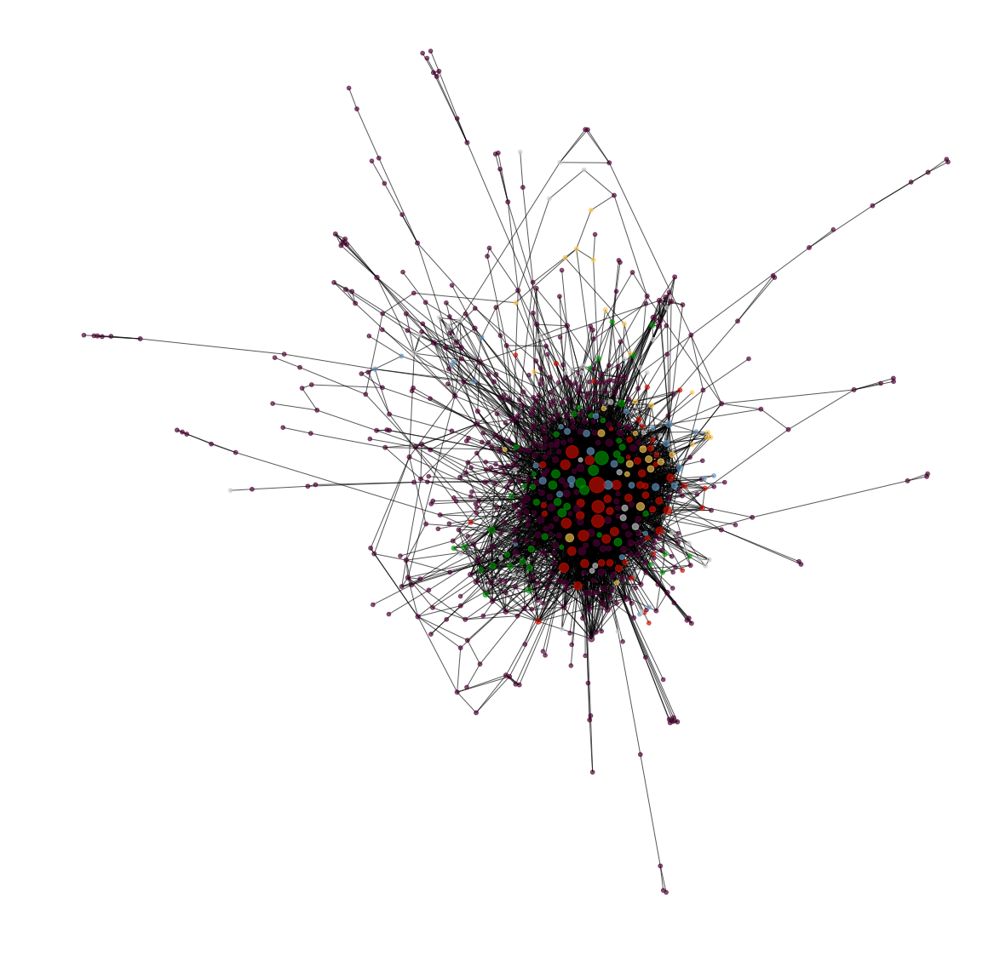

In [45]:
display_network_no_lables(
    relevant_characters,
    pos=wiki_positions, 
    size_map=[20 + relevant_characters.degree(n) for n in relevant_characters.nodes],
    color_map=[generate_node_color(n, clean_character_dict) for n in relevant_characters.nodes],
    save = False,
    file_name = "wikiNEt1"
)

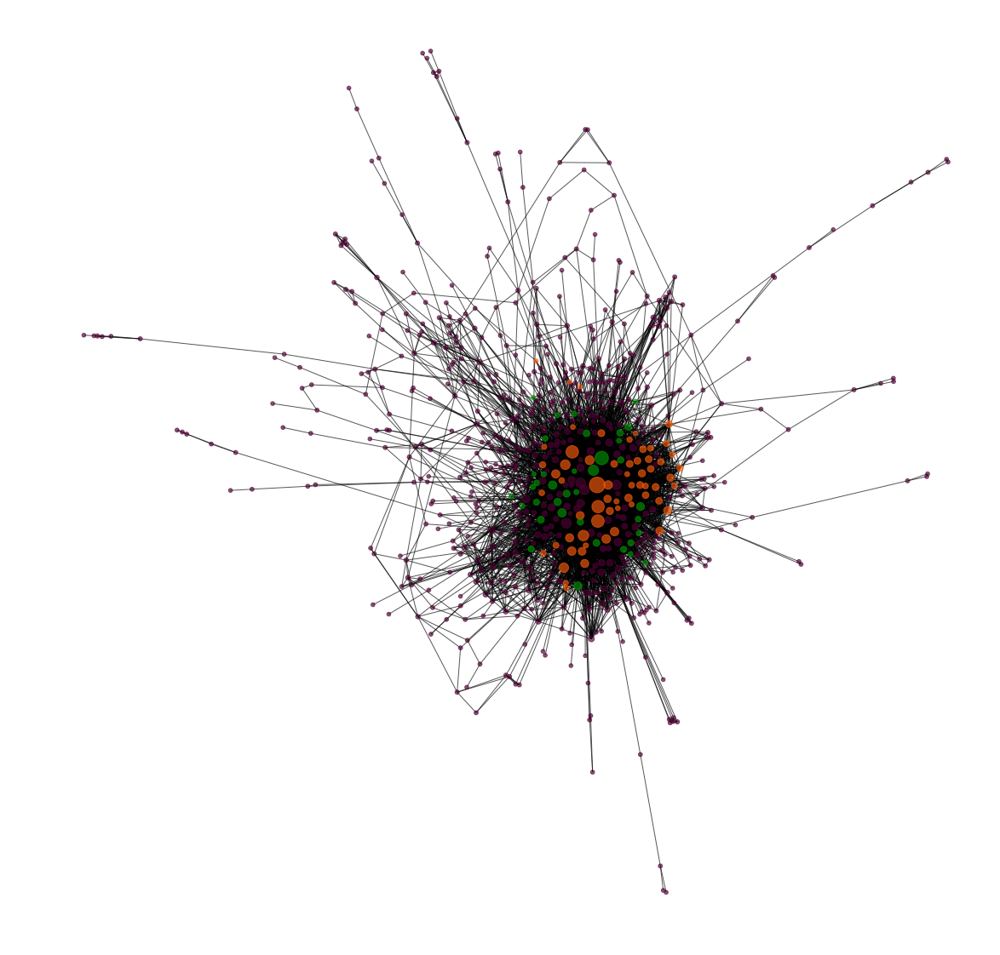

In [46]:
display_network_no_lables(
    relevant_characters,
    pos=wiki_positions, 
    size_map=[20 + relevant_characters.degree(n) for n in relevant_characters.nodes],
    color_map=[generate_node_color_good_evil(n, clean_character_dict) for n in relevant_characters.nodes],
    save = False,
    file_name = "wikiNet2"
)

In [47]:
sorted(relevant_characters.degree(), key=lambda kv: kv[1], reverse=True)

[(u'harry potter', 319),
 (u'tom riddle', 230),
 (u'ronald weasley', 199),
 (u'albus dumbledore', 196),
 (u'hermione granger', 192),
 (u'ginevra weasley', 134),
 (u'severus snape', 124),
 (u'sirius black', 117),
 (u'draco malfoy', 113),
 (u'rubeus hagrid', 110),
 (u'arthur weasley', 105),
 (u'dolores umbridge', 103),
 (u'neville longbottom', 99),
 (u'minerva mcgonagall', 90),
 (u'fred weasley', 83),
 (u'luna lovegood', 82),
 (u'george weasley', 80),
 (u'molly weasley', 80),
 (u'bellatrix lestrange', 77),
 (u'lucius malfoy', 76),
 (u'horace slughorn', 76),
 (u'nymphadora tonks', 72),
 (u'william weasley', 71),
 (u'remus lupin', 68),
 (u'cedric diggory', 67),
 (u'dean thomas', 66),
 (u'percy weasley', 65),
 (u'fleur delacour', 64),
 (u'peter pettigrew', 64),
 (u'rita skeeter', 63),
 (u'albus potter', 63),
 (u'angelina johnson', 59),
 (u'lee jordan', 56),
 (u'cornelius fudge', 56),
 (u'lily j. potter', 55),
 (u'kingsley shacklebolt', 54),
 (u'gilderoy lockhart', 54),
 (u'argus filch', 54)

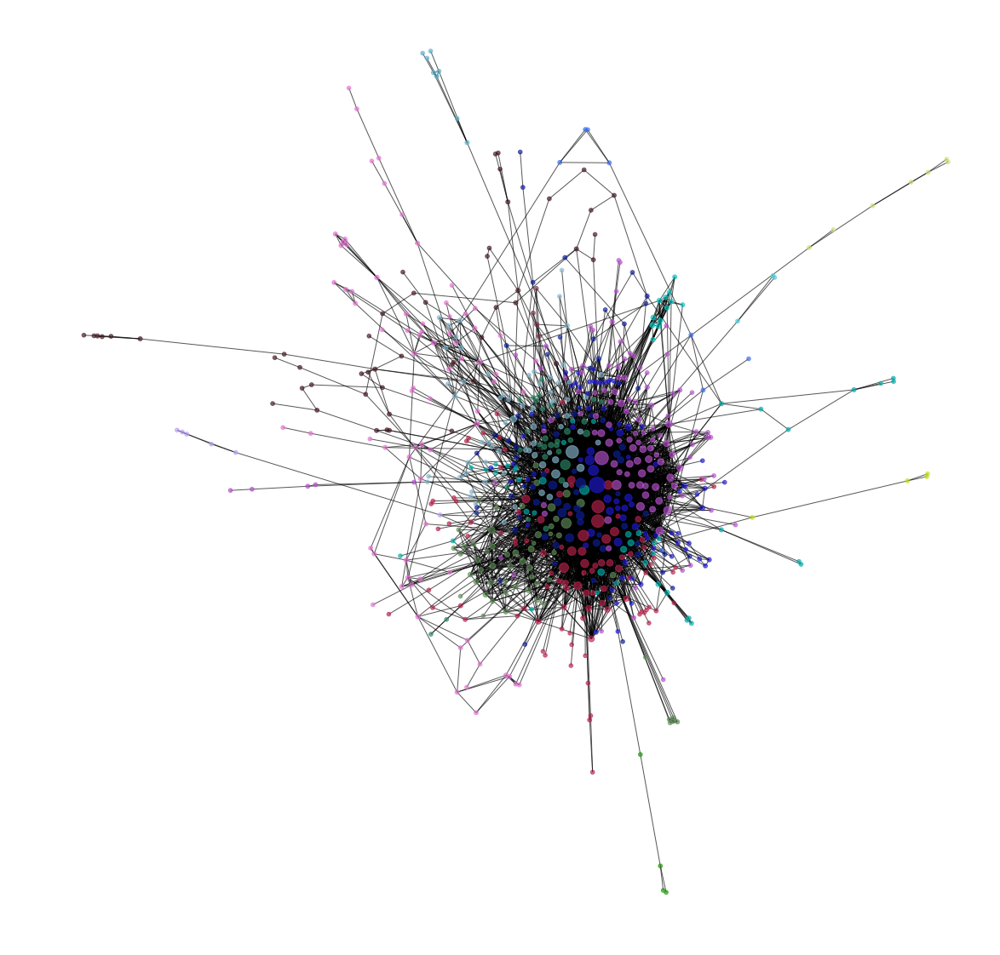

In [48]:
partitions = community.best_partition(relevant_characters,weight='weight')
unique_partitions = set(partitions.values())
partition_colors = dict(zip(unique_partitions, genrate_color_series(len(unique_partitions))))
color_map = [partition_colors[partitions[n]] for n in relevant_characters.nodes]

display_network_no_lables(
    relevant_characters,
    pos=wiki_positions, 
    size_map=[20 + relevant_characters.degree(n) for n in relevant_characters.nodes],
    color_map=color_map,
    save = False,
    file_name = "wikiNetCom"
)

In [49]:
grouped_by_community = defaultdict(list)

for character, community_id in partitions.iteritems():
    grouped_by_community[community_id].append((character,relevant_characters.degree(character)))

In [50]:
for community_id, characters in grouped_by_community.items()[:10]:
    print"------- community:", community_id, "-------"
    html = "<ul>"
    for character, degree in sorted(characters, key=itemgetter(1), reverse=True):
        print character, degree
        html += "<li>"+character+"</li>"
    html+= "</ul>"

------- community: 0 -------
tom riddle 230
neville longbottom 99
cedric diggory 67
dean thomas 66
angelina johnson 59
seamus finnigan 52
katie bell 52
poppy pomfrey 50
cho chang 49
pomona sprout 47
parvati patil 45
nagini 44
salazar slytherin 44
colin creevey 44
susan bones 44
hannah abbott 44
terry boot 43
sorting hat 43
sybill trelawney 42
justin finch-fletchley 42
alicia spinnet 41
lavender brown 40
ernest macmillan 39
zacharias smith 36
anthony goldstein 34
michael corner 33
padma patil 29
oliver wood 28
marietta edgecombe 27
romilda vane 26
merope riddle 25
cormac mclaggen 25
firenze 23
leanne 21
dennis creevey 20
helena ravenclaw 20
tom 19
frank bryce 19
morfin gaunt 18
alice longbottom 18
frank longbottom 18
tom riddle senior 17
rowena ravenclaw 17
amos diggory 17
godric gryffindor 16
charity burbage 16
marvolo gaunt 15
amelia bones 14
helga hufflepuff 14
selwyn 13
trevor 12
hepzibah smith 11
cole 10
caractacus burke 10
bob ogden 10
borgin 9
demelza robins 9
galatea merrythough

glynnis griffiths 2
gwenog 2
timothy blenkinsop 2
felix summerbee 1
rudolf brand 1
hector bolobolo 1
herman junker 1
raul almeida 1
barnabus blenkinsop 1
franziska faust 1
abernathy 1
dougal 1
mullet 1
matilda dukelow 1
------- community: 6 -------
robert hilliard 9
lily moon 7
leonard spencer-moon 7
gabriel truman 5
dennis moon 5
uric the oddball 5
goodwin kneen 5
glenda chittock 4
radulf 4
lorcan mclaird 4
loxias 4
arcus 3
phyllida spore 3
barnabas deverill 3
priscilla dupont 3
egbert the egregious 3
archer evermonde 3
hector fawley 3
hengist of woodcroft 3
gunhilda kneen 3
ignatia wildsmith 3
bridget wenlock 3
livius 3
hengist of upper barnton 2
olaf 2
hereward 2
bogomil levski 2
wilhelmina tuft 2
devlin whitehorn 2
charlie baverstock 2
lord palmerston 2
alberta toothill 2
ugga 2
emeric the evil 2
ignatius tuft 2
radolphus pittiman 2
winston churchill 2
godelot 2
gifford ollerton 2
lorcan d'eath 2
dugald mcphail 2
venusia crickerly 1
perpetua fancourt 1
derwent shimpling 1
oona 1
br

# Generate and Analyze Movie Networks

In [51]:
files = [
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt",
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt",
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt",
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt",
    "HP5.txt",
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt",
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt",
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt" 
]

In [52]:
with open('nameDict.json') as json_file:  
    name_dict = json.load(json_file, encoding="utf-8")

In [53]:
with open('characterInfoDict.json') as json_file:  
    info_dict = json.load(json_file, encoding="utf-8")

In [54]:
ignore_in_movie={
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt": {"bertie", "jack", "po", "nicholas"},
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt": {"fluffy", "tufty", "gryffindor"},
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt": {"miranda", "ernie", "horace"},
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt": {"monsieur"},
    "(5)_Harry_Potter_and_the_Order_of_the_Phoenix.txt": {"gideon"},
    "HP5.txt":{"oswald", "bob"},
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt": {"WOOD", "felix"},
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt": {"percival", "elizabeth", "WOOD"},
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt": {"WOOD", "fang"}
}

In [55]:
special_cases = {
    "WOOD":"oliver wood", 
    "OLIVER WOOD": u"oliver wood", 
    "oliver wood": u"oliver wood",
    "Oliver wood": u"oliver wood",
    "mrs. weasley": u"molly weasley", 
    "mr. weasley": u"arthur weasley",
    "arthur weasley's daughter": u"ginny weasley",
    "ERNIE PRANG": u"ernie prang",
    "wailing widow": u"wailing widow",
    "Miss Brown": u"lavender brown",
    "MRS BLACK": u"walburga black",
    "BARTY JR": u"barty crouch jr.",
    "BARTY SR": u"barty crouch",
    "Frank Longbottom": u"frank longbottom",
    "HUGO": u"hugo granger-weasley",
    "ALBUS_SON": u"albus severus potter",
    "LILY_DAUGTER": u"lily l. potter",
    "ROSE_DAUGHTER": u"rose granger-weasley",
    "JAMES_SON": u"james potter ii",
    "ADRIAN": u"adrian (photographer)",
    "SIR_NICHOLAS": u"sir nicholas",
    "Gideon": u"gideon prewett",
    "LUCIOUS MALFOY": u"lucius malfoy",
    "Bob_muggle":"bob"
}

In [56]:
movies = []

# go through all scripts and process them
for script_name in files:
    with open("../movieScripts/" + script_name) as f:
        script = f.read()
        ignore = []
        if ignore_in_movie.has_key(script_name):
            ignore = ignore_in_movie[script_name]
        
        data = process_script(
            script=script, 
            tokenizer=word_tokenizer, 
            name_mappings=name_dict, 
            special_cases=special_cases, 
            ignore=ignore
        )
        movies.append(data)

In [57]:
with open("shortNames.json", "r") as json_dict:
    shortNames = json.load(json_dict)

100%|██████████| 10000/10000 [00:02<00:00, 3514.94it/s]


('BarnesHut Approximation', ' took ', '0.54', ' seconds')
('Repulsion forces', ' took ', '1.88', ' seconds')
('Gravitational forces', ' took ', '0.04', ' seconds')
('Attraction forces', ' took ', '0.06', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.14', ' seconds')


100%|██████████| 10000/10000 [00:03<00:00, 2622.61it/s]


('BarnesHut Approximation', ' took ', '0.69', ' seconds')
('Repulsion forces', ' took ', '2.61', ' seconds')
('Gravitational forces', ' took ', '0.04', ' seconds')
('Attraction forces', ' took ', '0.06', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.16', ' seconds')


100%|██████████| 10000/10000 [00:03<00:00, 3225.81it/s]


('BarnesHut Approximation', ' took ', '0.55', ' seconds')
('Repulsion forces', ' took ', '2.11', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.07', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.13', ' seconds')


100%|██████████| 10000/10000 [00:02<00:00, 4677.27it/s]


('BarnesHut Approximation', ' took ', '0.39', ' seconds')
('Repulsion forces', ' took ', '1.39', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.04', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.13', ' seconds')


100%|██████████| 10000/10000 [00:03<00:00, 3027.55it/s]


('BarnesHut Approximation', ' took ', '0.60', ' seconds')
('Repulsion forces', ' took ', '2.23', ' seconds')
('Gravitational forces', ' took ', '0.04', ' seconds')
('Attraction forces', ' took ', '0.05', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.14', ' seconds')


100%|██████████| 10000/10000 [00:03<00:00, 2590.00it/s]


('BarnesHut Approximation', ' took ', '0.74', ' seconds')
('Repulsion forces', ' took ', '2.61', ' seconds')
('Gravitational forces', ' took ', '0.04', ' seconds')
('Attraction forces', ' took ', '0.06', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.17', ' seconds')


100%|██████████| 10000/10000 [00:06<00:00, 1610.05it/s]


('BarnesHut Approximation', ' took ', '1.11', ' seconds')
('Repulsion forces', ' took ', '4.35', ' seconds')
('Gravitational forces', ' took ', '0.06', ' seconds')
('Attraction forces', ' took ', '0.12', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.23', ' seconds')


100%|██████████| 10000/10000 [00:04<00:00, 2139.50it/s]


('BarnesHut Approximation', ' took ', '0.85', ' seconds')
('Repulsion forces', ' took ', '3.14', ' seconds')
('Gravitational forces', ' took ', '0.04', ' seconds')
('Attraction forces', ' took ', '0.11', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.21', ' seconds')


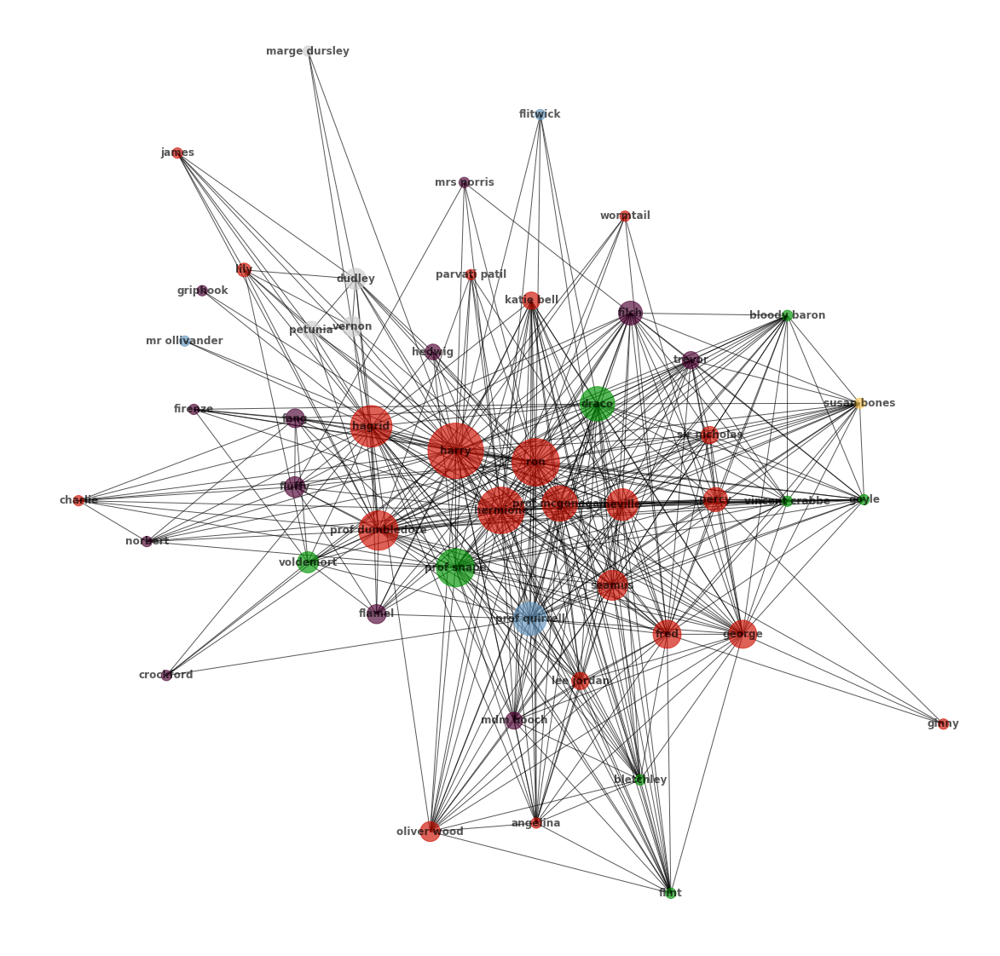

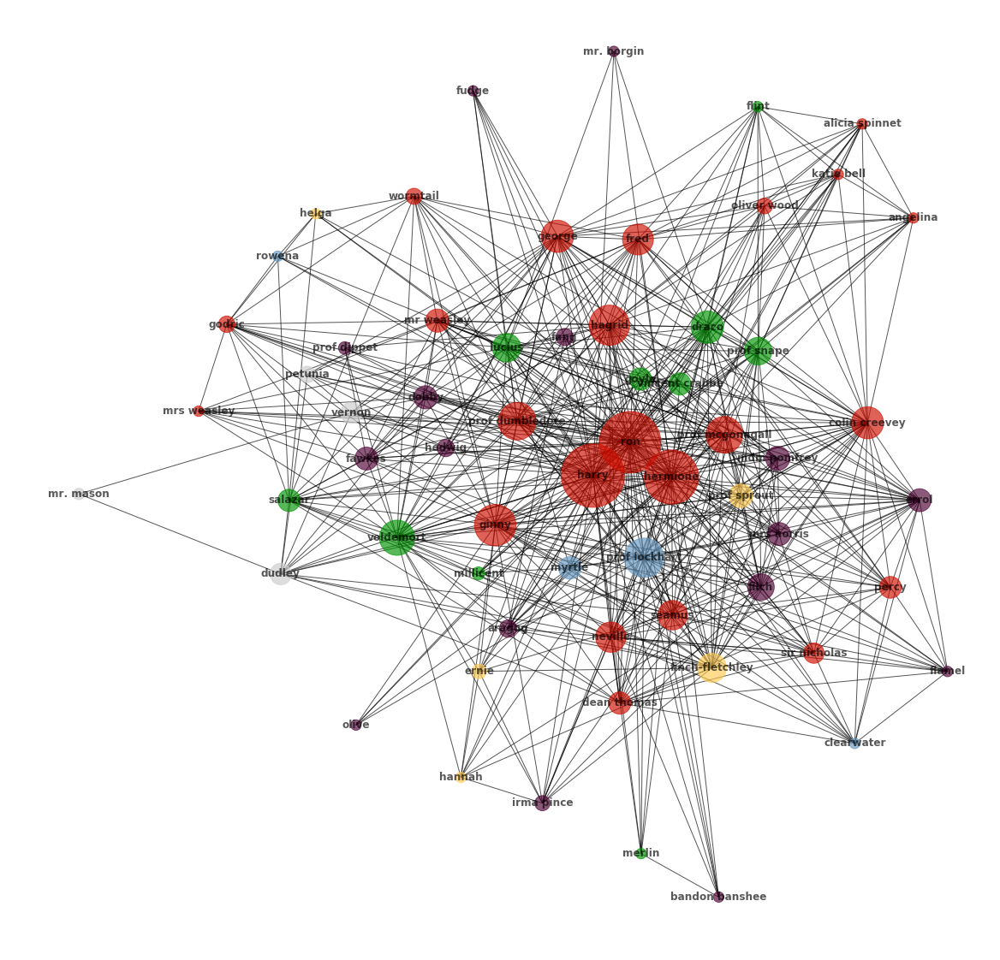

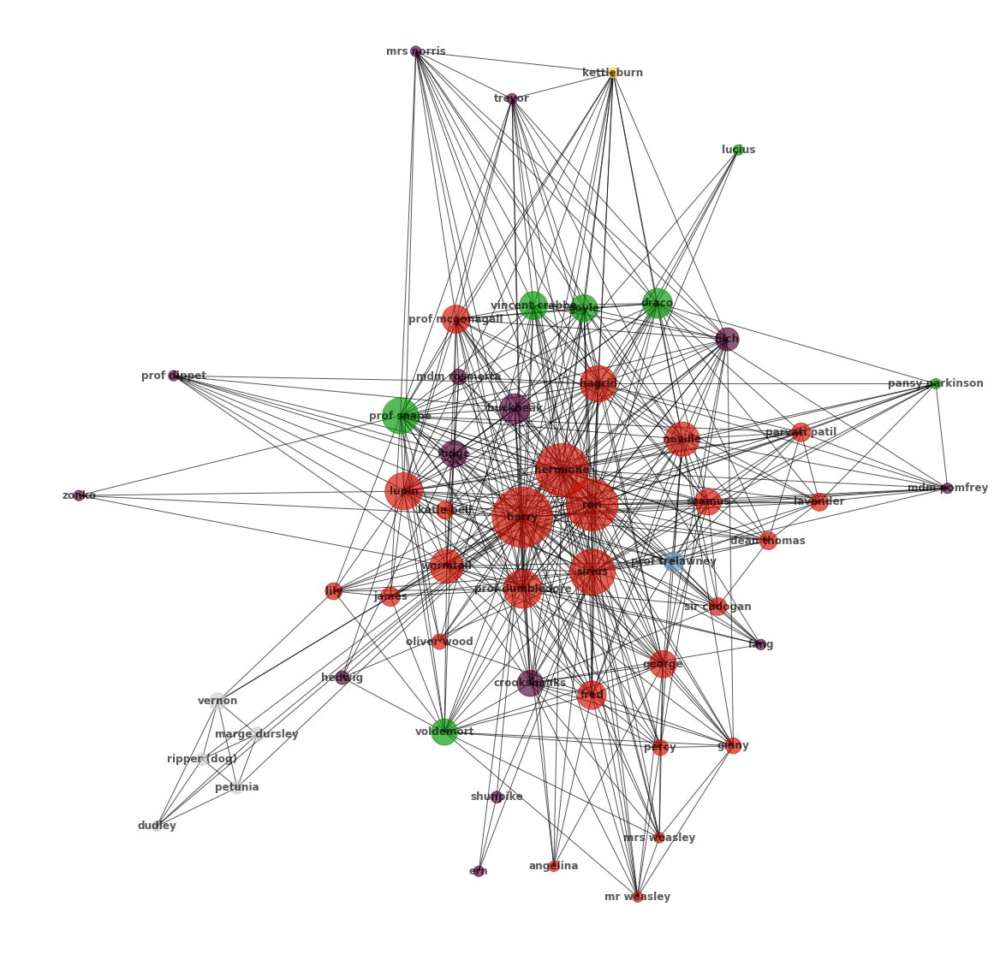

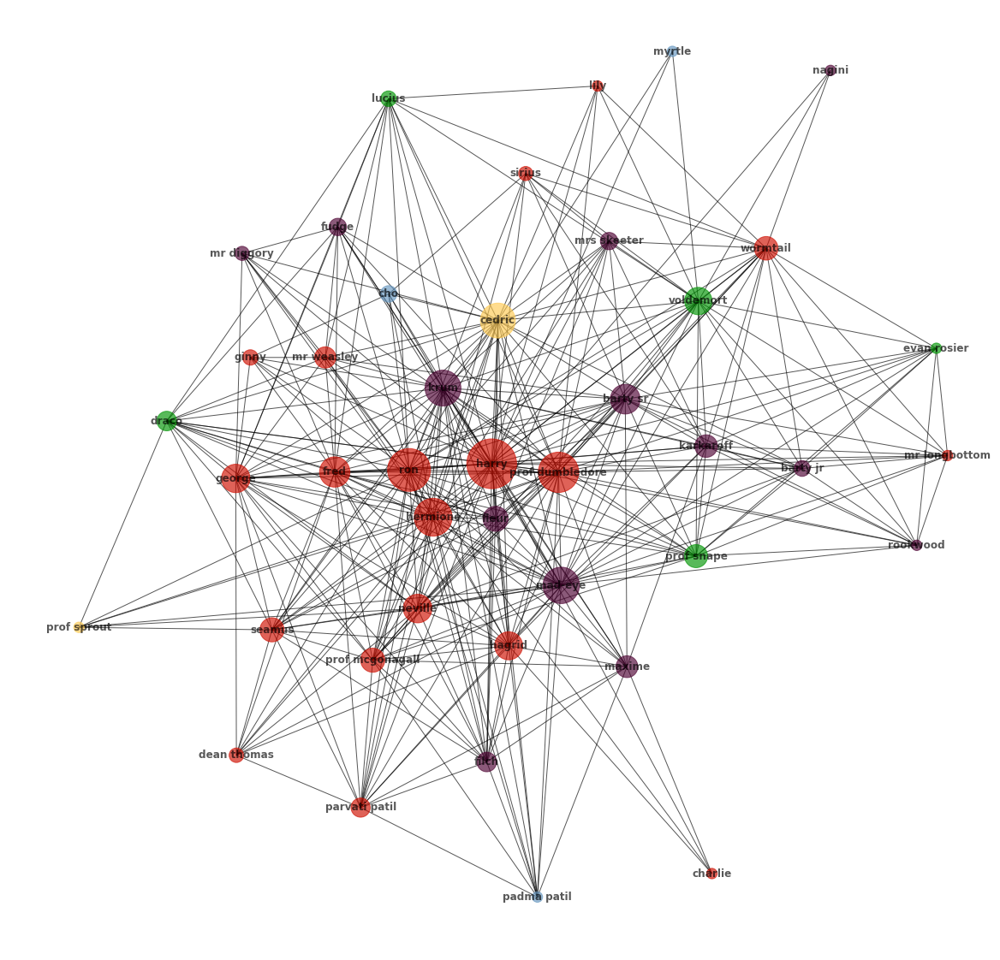

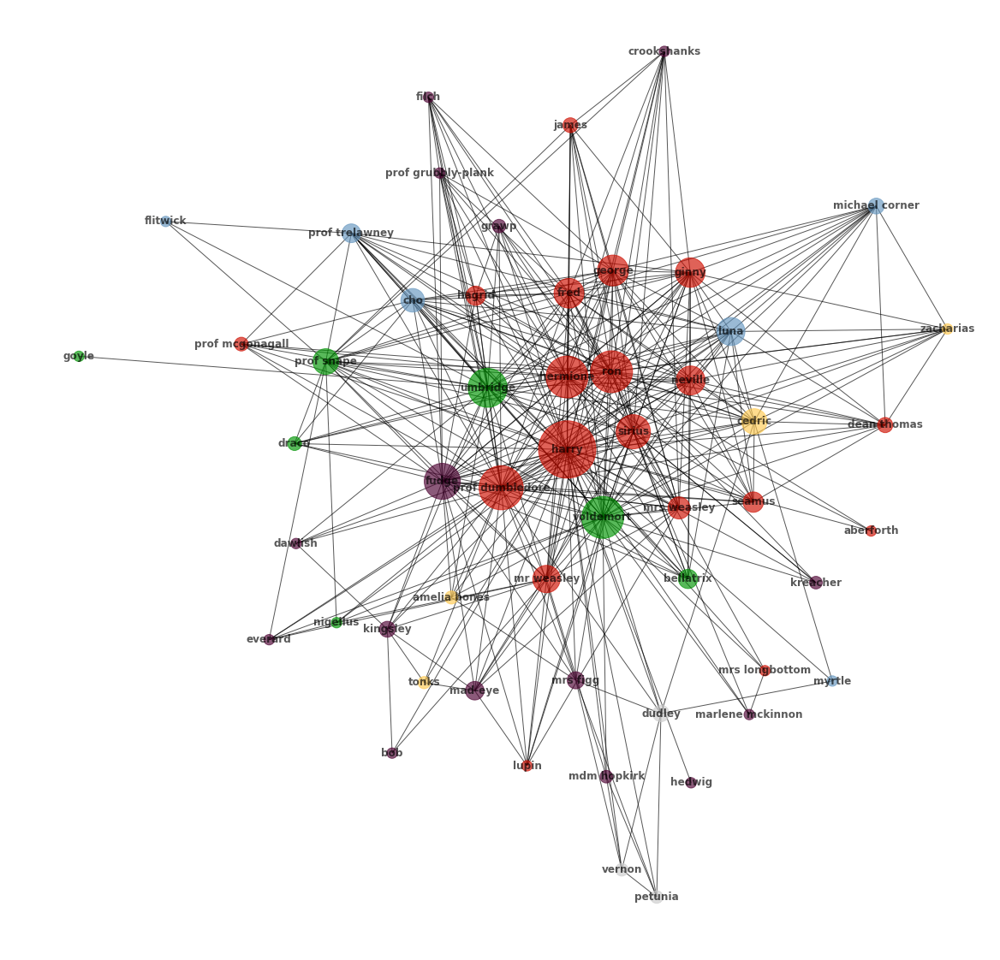

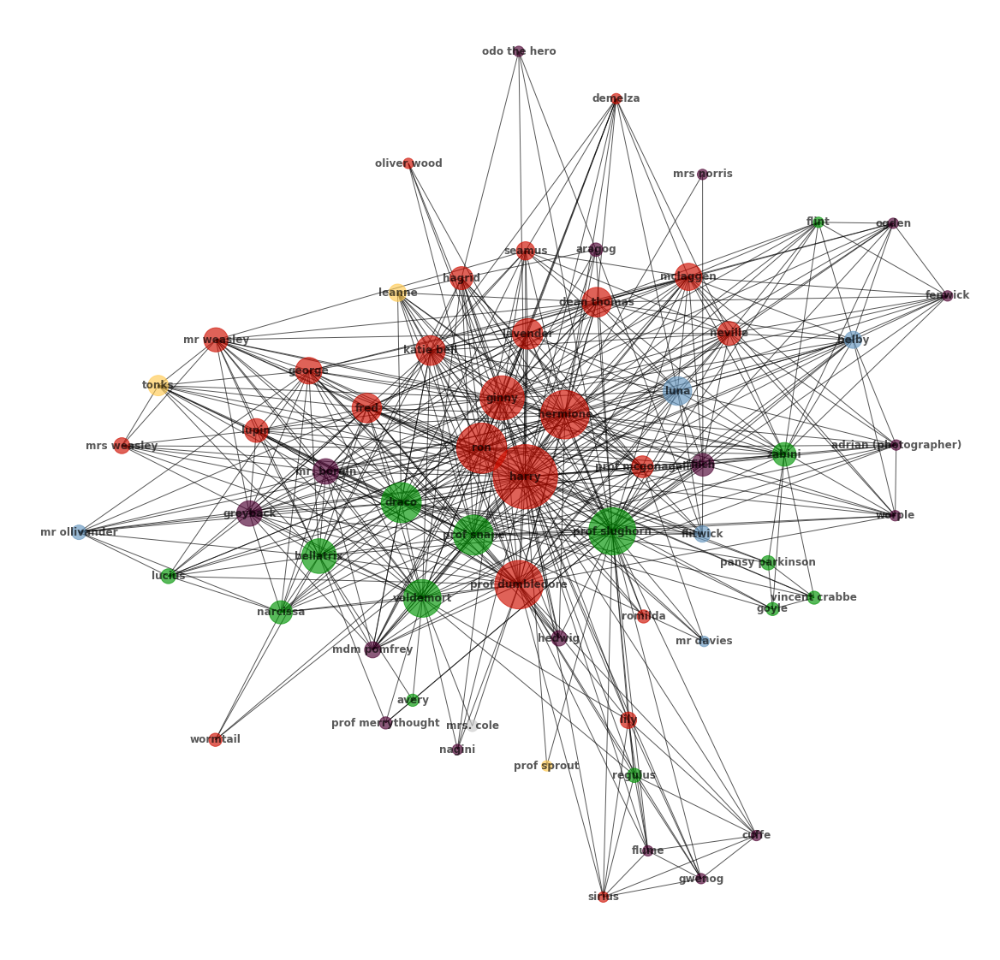

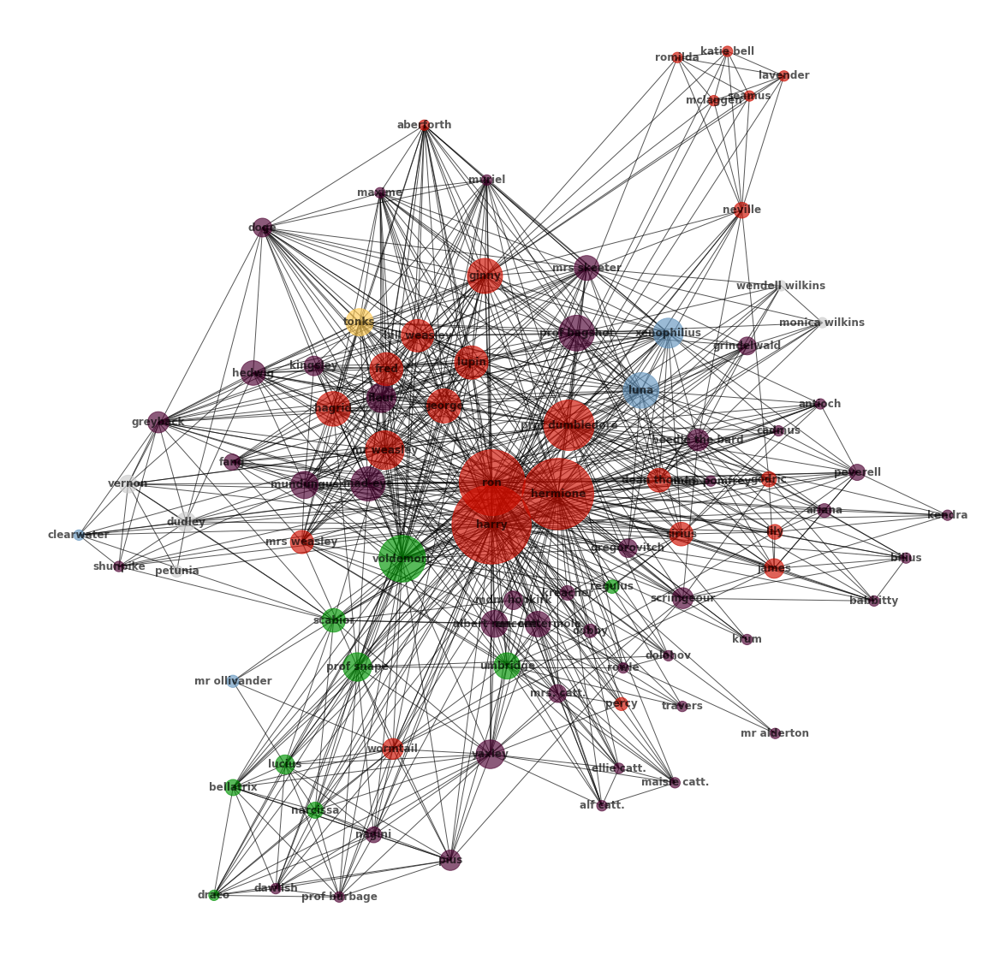

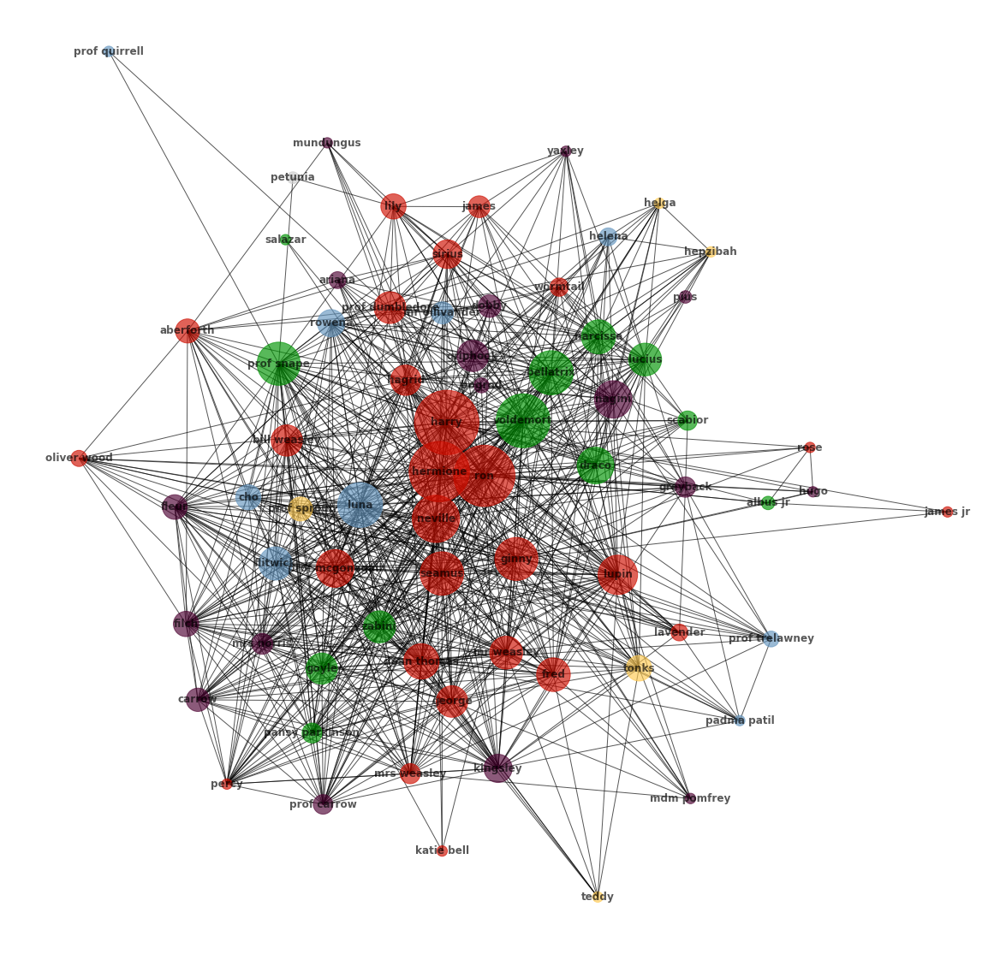

In [58]:
networks = []
positions = []

forceatlas2 = FA2(scalingRatio=100, gravity=100)

for index , movie in enumerate(movies):
    G = generate_movie_network(movie.occurrences) 
    position = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=10000)
    short_labels = {n:shortNames[n] for n in G.nodes}
    node_size = [150 + int(20 * G.degree(n) * log(total_occurences(movie.occurrences, n))) for n in G.nodes]
    color_map = [generate_node_color(n, info_dict) for n in G.nodes]
    display_network(G, position, node_size, color_map, save=save_plots, file_name="movie"+str(index+1), node_lables=short_labels)
    networks.append(G)
    positions.append(position)

Disadvantages of adding a note to each character taht is mentioned in a scene: the chatacter might only appear in one scene but could get an infalted degree if many other characters are mentioend in the scnene.

<Figure size 432x288 with 0 Axes>

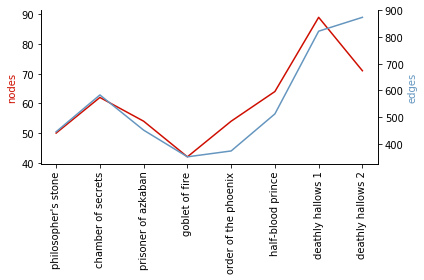

In [59]:
nodes = []
edges = []

for index, network in enumerate(networks):
    nodes.append(len(network.nodes))
    edges.append(len(network.edges))
    
labels = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"
]

plot_networks_over_time(nodes, edges, labels, save=save_plots, file_name="degreeSeries")

In [60]:
with open("../characters.json") as f:
    characters = json.load(f) 

In [61]:
degrees_by_movie = defaultdict(list)

for index, network in enumerate(networks):
    top_degrees = sorted(nx.degree(network), key=itemgetter(1), reverse=True)[:20]
    for node, degree in top_degrees:
        degrees_by_movie[node].append((index, degree))

In [62]:
labels = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"
]

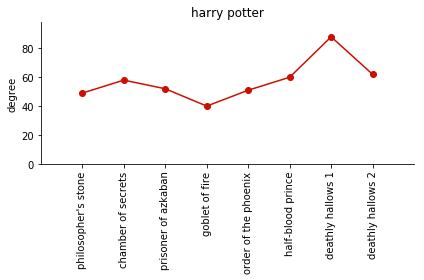

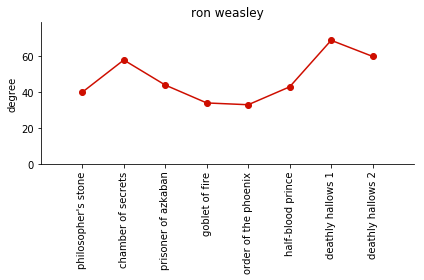

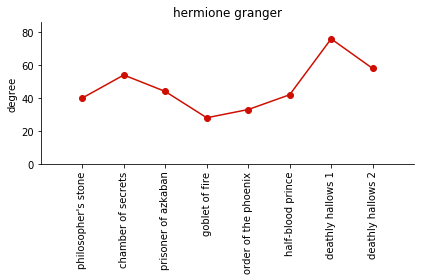

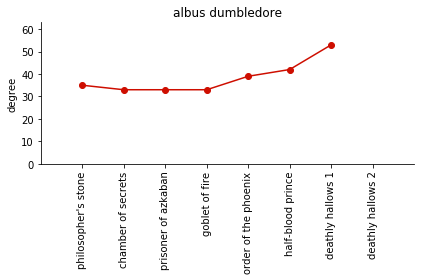

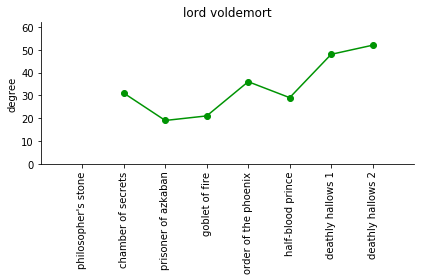

...

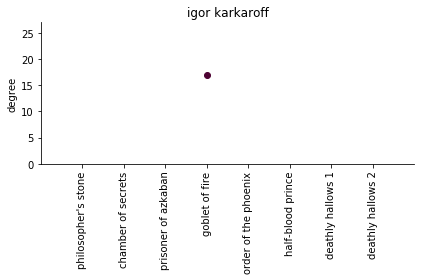

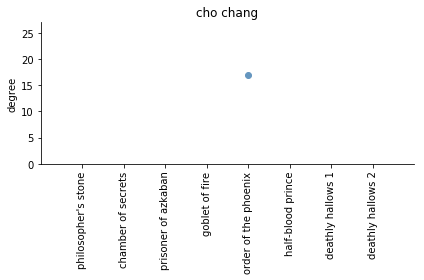

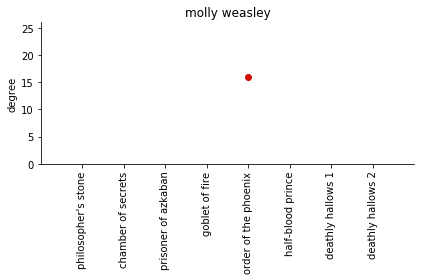

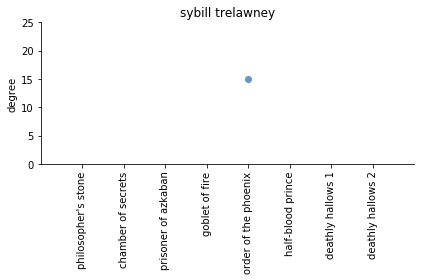

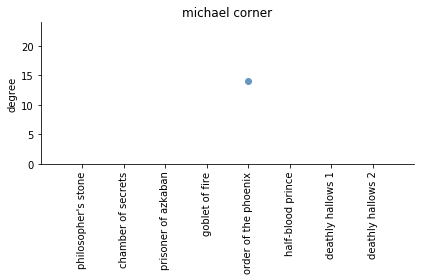

In [63]:
sorted_by_most_total_degrees = sorted(degrees_by_movie.iteritems(), key=lambda kv: sum(zip(*kv[1])[1]), reverse=True)
for index, (node, degrees) in enumerate(sorted_by_most_total_degrees):
    x,y = zip(*degrees)
    color = generate_node_color(node, info_dict)
    name = "degree" + str(index+1)
    display_degree_series(x, y, node, color, labels, save=save_plots, file_name=name)

In [64]:
#put all characters that acutally are in the networks  into a dictionary
#where the names can be shortend manually
json_dict_name = "shortNames.json"

with open(json_dict_name, "r") as json_dict:
    shortNames = json.load(json_dict)
    for network in networks:
        for node in network.nodes:
            if not shortNames.has_key(node):
                print "adding:", node
                shortNames[node] = node

with open(json_dict_name, "w") as json_dict:
    json.dump(shortNames, json_dict)

In [68]:
missing_infos = []
for movie in movies:
    for scene, characters in movie.occurrences.iteritems():
        for character in characters:
            if not info_dict.has_key(character):
                print character
                #missing_infos.append(character)            

In [70]:
missing_info_dict = {}
for character in set(missing_infos):
    missing_info_dict[character] = {"house":"", "blood":"", "loyaty":[]}

In [71]:
"""with open("missingInfoDict.json", "w") as json_file:
    json.dump(missing_info_dict, json_file)"""

'with open("missingInfoDict.json", "w") as json_file:\n    json.dump(missing_info_dict, json_file)'

adding: amelia susan bones
adding: bob ogden
adding: oswald beamish
adding: wilhelmina grubbly-plank

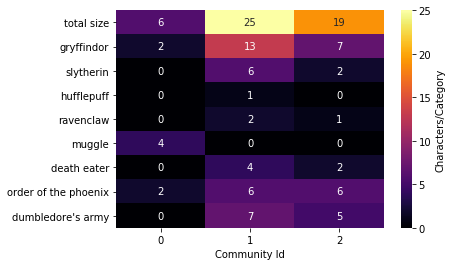

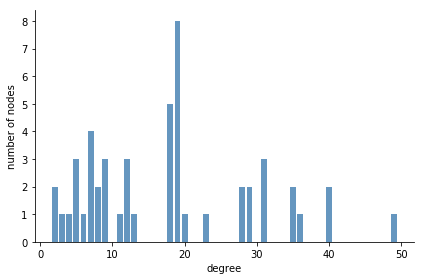

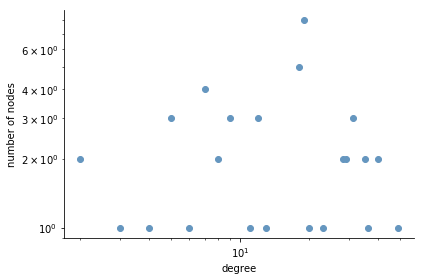

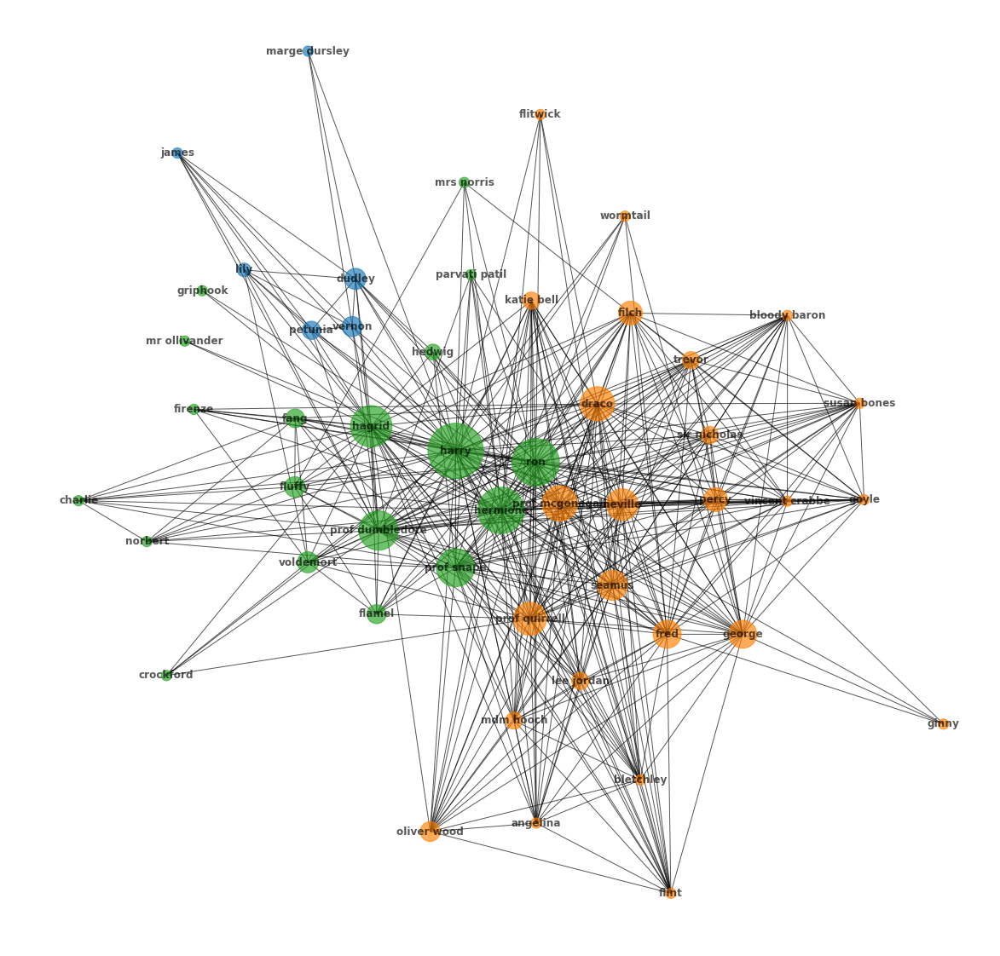

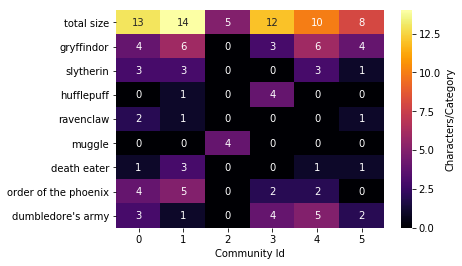

...

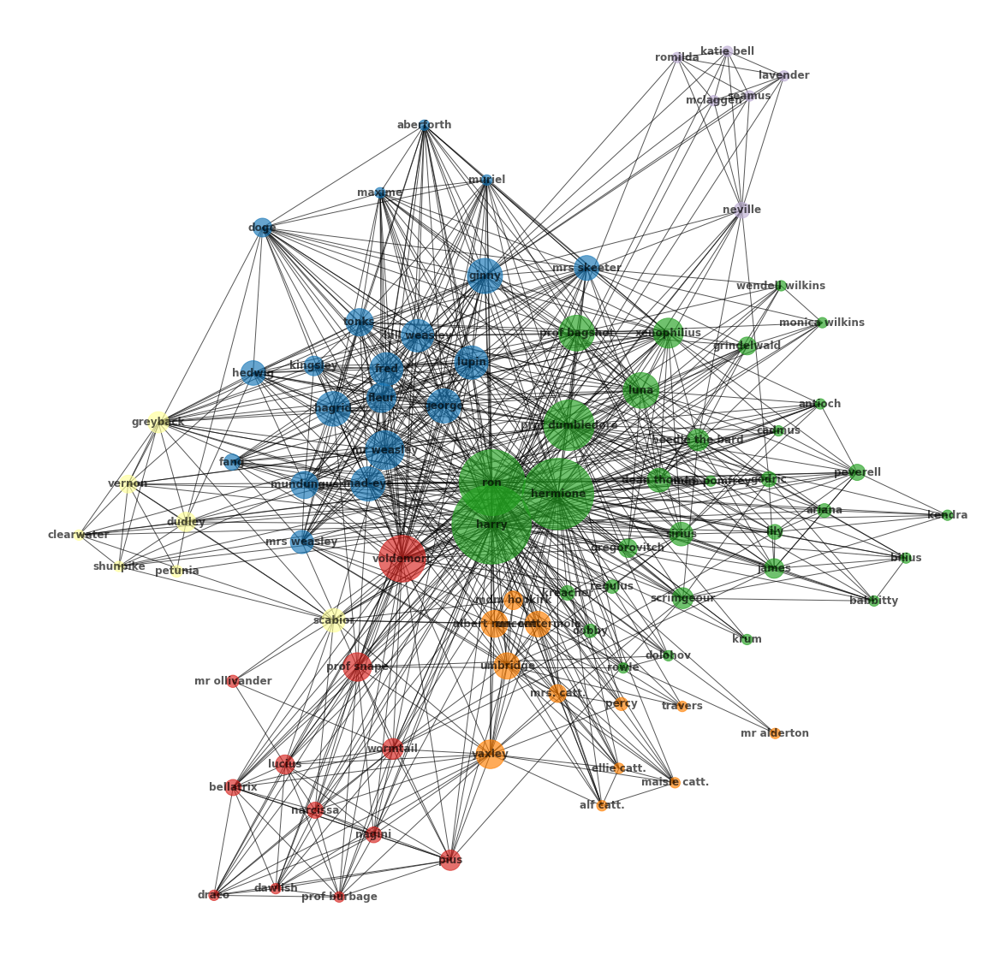

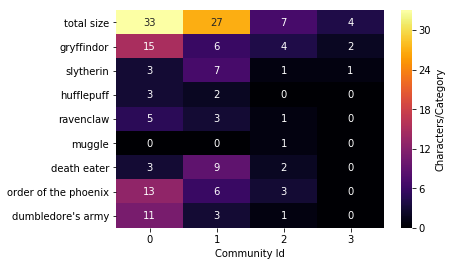

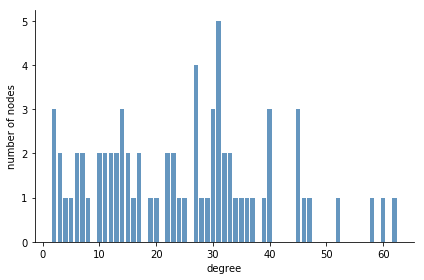

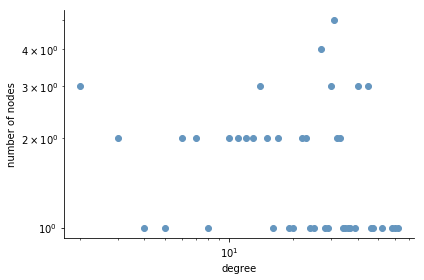

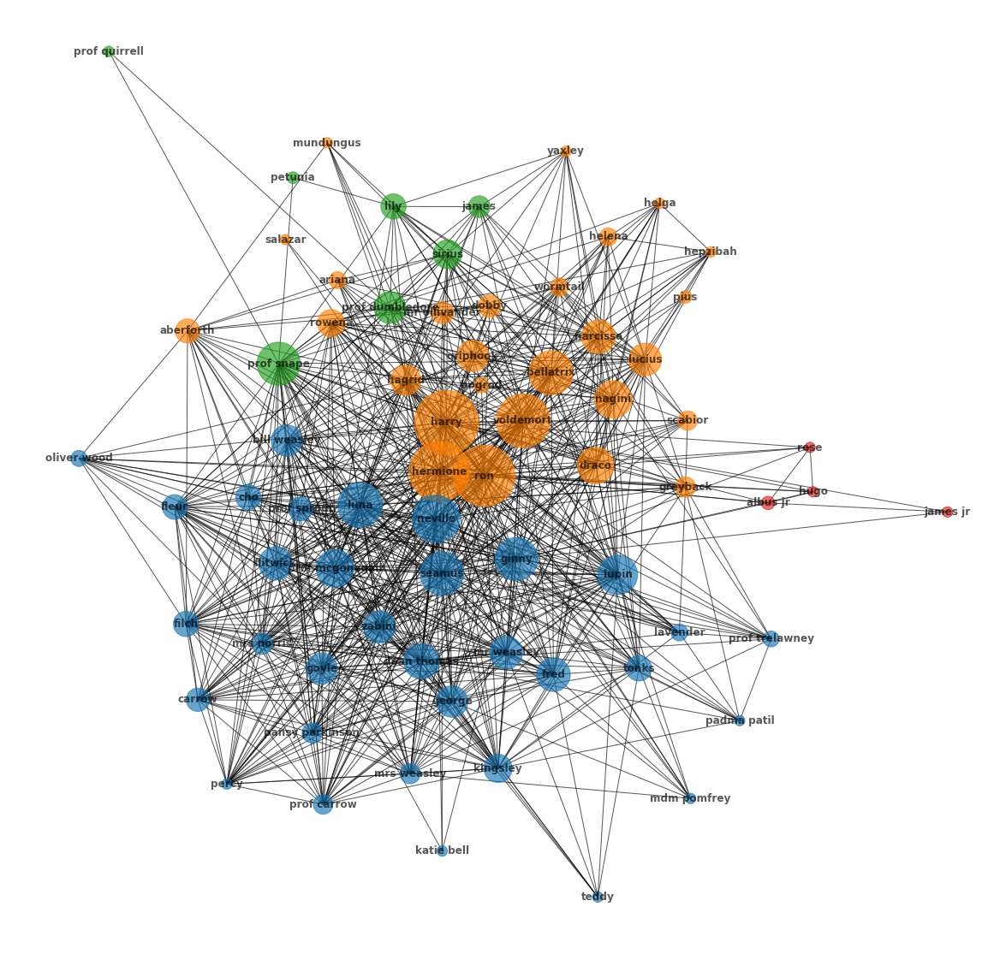

In [72]:
for index, (G, position, movie) in enumerate(zip(networks, positions, movies)):
    file_suffix = "Movie"+ str(index+1)
    partitions = community.best_partition(G,weight='weight')
    unique_partitions = set(partitions.values())
    
    partition_colors = generate_colors(unique_partitions)
    short_labels = {n:shortNames[n] for n in G.nodes}
    node_size = [150 + int(20 * G.degree(n) * log(total_occurences(movie.occurrences, n))) for n in G.nodes]
    color_map = [partition_colors[partitions[n]] for n in G.nodes]
    
    matrix = analyze_communities(partitions, info_dict)
    
    heatmap_name = "heatmap" + file_suffix
    display_community_heatmap(matrix, color_map="inferno", save=save_plots, file_name=heatmap_name)
    
    distribution_name = "distr" + file_suffix 
    display_degree_destribution(G.degree(), save=save_plots, file_name=distribution_name)
    
    network_name = "communities" + file_suffix
    display_network(
        G, 
        position, 
        node_size, 
        color_map, 
        save=save_plots, 
        file_name=network_name, 
        node_lables=short_labels)
    
   

## 3.2) TF-IDF and Sentiments Analysis

In [73]:
#open a text file of all the books in the book series
raw = io.open('../books/HP_all.txt', "r", encoding="utf-8").read()
#Extract any additional information on the books from the beginning and end of the file.
#books = raw[944:6317630]

In [74]:
#Isolate each book individually, from the first chapter to the last fullstop.
book1 = raw[944:441162]
book2 = raw[442547:936710]
book3 = raw[938248:1567329]
book4 = raw[1569412:2678784]
book5 = raw[2680953:4180604]
book6 = raw[4182370:5170313]
book7 = raw[5173433:6317630]

In [75]:
#Collect all the books into an arrey to more simply navigate and extract information.
book = []
book.append(book1)
book.append(book2)
book.append(book3)
book.append(book4)
book.append(book5)
book.append(book6)
book.append(book7)
print(len(book))

7


In [76]:
#Create a list of lists with the individual chapters, split at the unique word CHAPTERS.
chp = []
for bok in book:
    chp.append(bok.split("CHAPTER")[1:])
print(len(chp))

7


In [79]:
#the stopwords for later use  in the wordcloud
stop_words = set(stopwords.words('english'))
#including "said" as it is appeard repeatedly on th wordclouds.
stop_words.add(u'said')
#print(stop_words)
#print(type(stopwords.words('english')))

In [80]:
#Function to extract only the dialog from a text, while also making sure to accound for utf-8
def dialog(book):
    book = book.encode("utf-8")
    book = book.replace('\xe2\x80\x99','\'')
    book = book.replace('\xe2\x80\x94','-')
    book = book.replace('\xe2\x80\x98','\'')
    book = book.replace("\n\n\xe2\x80\x9c", ' ')
    dialogen = re.findall(r'\“([\s\S]*?)\”', book)
    return dialogen

In [81]:
#Cleanign text, with respect to utf-8
def tolist(book):
    book = book.encode("utf-8")
    book = book.replace('\xe2\x80\x99','\'')
    book = book.replace('\xe2\x80\x94','-')
    book = book.replace('\xe2\x80\x98','\'')
    book = book.replace("\n\n\xe2\x80\x9c", ' ')
    book = book.replace("\u2019","\'")
    book = book.replace('\n',' ')
    out = book
    return out

In [82]:
#Extracting the average happyness index to be used for sentiment analysis
from collections import defaultdict
ds = pd.read_csv('../Data_Set_S1.txt', skiprows=3, sep=" ", delimiter="\t")
ds.word[ds.word == 'after'].index[0]

avg_word_happiness = defaultdict(float)
for index, data in ds.iterrows():
    word =  data["word"]
    score = data["happiness_average"]
    avg_word_happiness[word] = score

In [83]:
#function to calculate sentiment on a list of tokens
def sentiment(toke):
    tokens = [x.lower() for x in toke]
    unique_tokens = list(set(tokens))
    sum = 0
    remove = 0
    for token in unique_tokens:
        if avg_word_happiness.has_key(token):
            h = avg_word_happiness[token]
            f = tokens.count(token)
            sum += (h*f)
        else:
            remove += tokens.count(token)
    if (len(tokens)-remove) == 0:
        sent = 0
    else:
        sent= sum/(len(tokens)-remove)
    return sent

In [84]:
#creating a list of lists of the the dialogs on each book.
dilog = []
for bok in book:
    dilog.append(dialog(bok))
print(len(dilog))

7


In [85]:
#tokenizes an list input
def tokenize_list(text):
    tokenizer = RegexpTokenizer(r'\w+')
    dialog = []
    for i in range(len(text)):
        line = tokenizer.tokenize(text[i])
        dialog.append(line)
    return dialog

#tokenizes a string input
def tokenize_str(text):
    tokenizer = RegexpTokenizer(r'\w+')
    line = tokenizer.tokenize(text)
    return line

In [86]:
#function to evaluate the sentiment analysis of the dialog
def sentiment_dilog(dialog):
    g = tokenize_list(dialog)
    sent = []
    for i in range(len(g)):
        sen = sentiment(g[i])
        sent.append(sen)
    return sent

In [87]:
#Find the sentimen for each of the books based on dialog. i belive this is the most efficient as dialog better reflects
#a mood than the desciptive parts of a book.
sendilog = []
for boook in dilog:
    sendilog.append(sentiment_dilog(boook))
for senti in sendilog:
    print(np.mean(senti))

5.308377204471506
5.295769655712531
5.286883953145128
5.267052585703176
5.272197023995928
5.2909159492604605
5.20978714308175


In [88]:
#dilog[0]

In [89]:
#Sentimant analysis of each book
senbook = []
for each in book:
    senbook.append(sentiment(tokenize_str(each)))
    print(sentiment(tokenize_str(each)))

5.33385911817
5.32007207254
5.31981087567
5.33023696409
5.32624551042
5.3280163771
5.29587962731


In [90]:
#function to extract stopwords from a string
def stopwords(book):
    unique = set(book)
    bo = book
    for word in unique:
        if word in stop_words:
            bo.remove(word)
    return bo

In [91]:
#remove stopwwords and tokenize the books
nostop = []
for each in book:
    nostop.append(stopwords(tokenize_str(each)))

In [92]:
#function to calculate the TF-IDF, tanken from prior assignment in the course
def TF_IDF(documents):
    result = []
    cross_document_freq = defaultdict(int)
    #count in how many documents the token occurs
    for document in documents:
        for token in set(document):
            cross_document_freq[token] += 1 
    
    for document in documents:
        TF = FreqDist(document)
        # calculate the TF/IDF for each token
        TF_IDF = defaultdict(float) 
        for token in TF.keys():
            TF_IDF[token] = TF[token] * log(len(documents)/cross_document_freq[token])
            
        result.append(sorted(TF_IDF.iteritems(), key=lambda (k,v): (v,k), reverse=True))
    return result

In [93]:
#For the world could illustration, taken form earlier exercise in the course
def generate_cloud_string(freq_list):
    result = ""
    for token, frequency in freq_list:
        result += (token + " ") * int(ceil(frequency))
    return result  

In [94]:
#Function to display the wordcloud, taken from earlier assignment in the course.
def display_cloud(string, background="black",mask=None, collocations=False, stop_words={}, title="wc" ):
    cloud = WordCloud(
        background_color=background,
        width=1800,
        height=1400,
        mask = mask,
        stopwords=stop_words,
        collocations=collocations
    ).generate(string)
    plt.figure(figsize=(20,20))
    plt.imshow(cloud)
    plt.axis('off')
    #plt.savefig("../plots/clouds/" + title + ".png", dpi=300)
    #itle(title)
    plt.show()

In [95]:
WC = TF_IDF([nostop[0],nostop[1],nostop[2],nostop[3],nostop[4],nostop[5],nostop[6]])

In [96]:
CL = []
for i in WC:
    CL.append(generate_cloud_string(i))

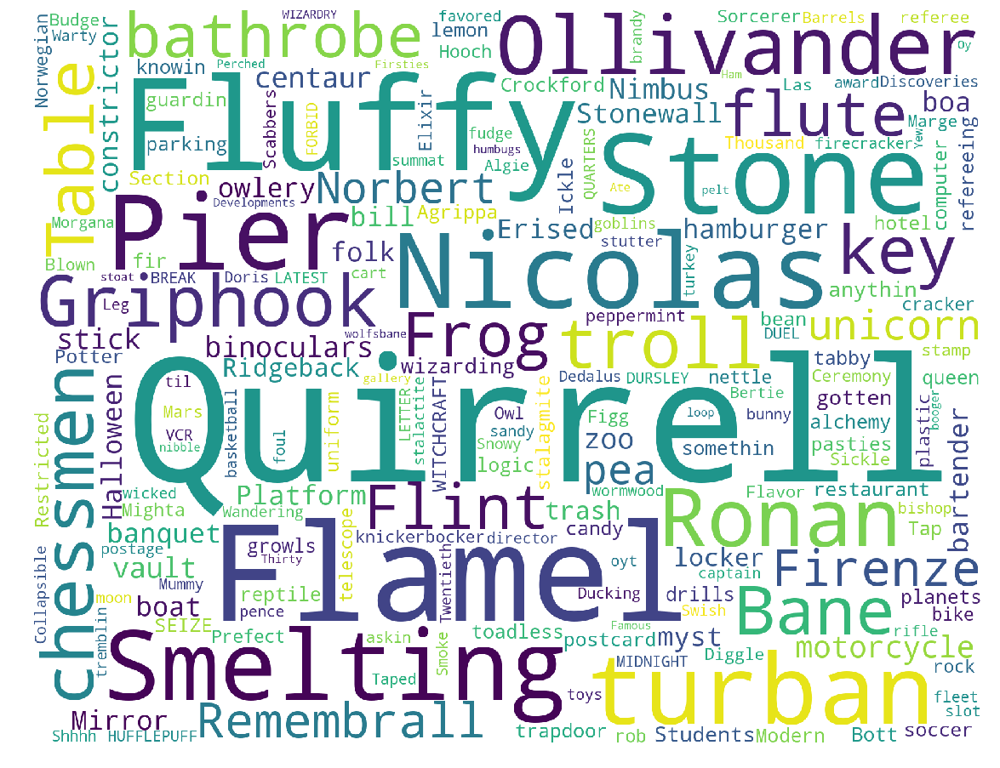

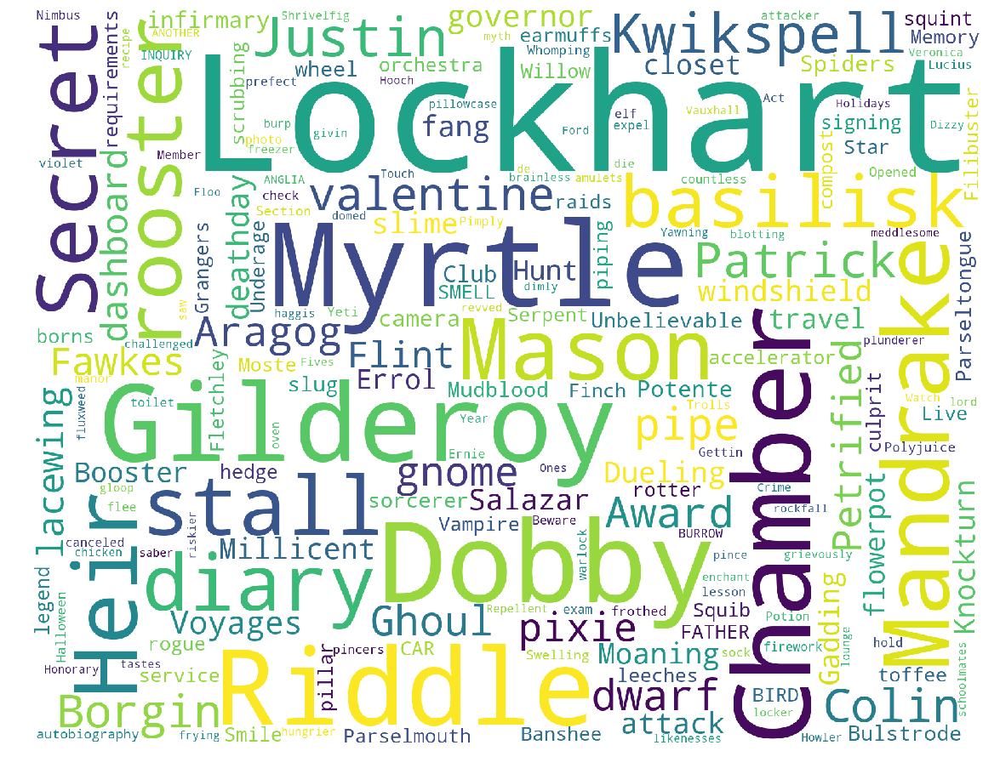

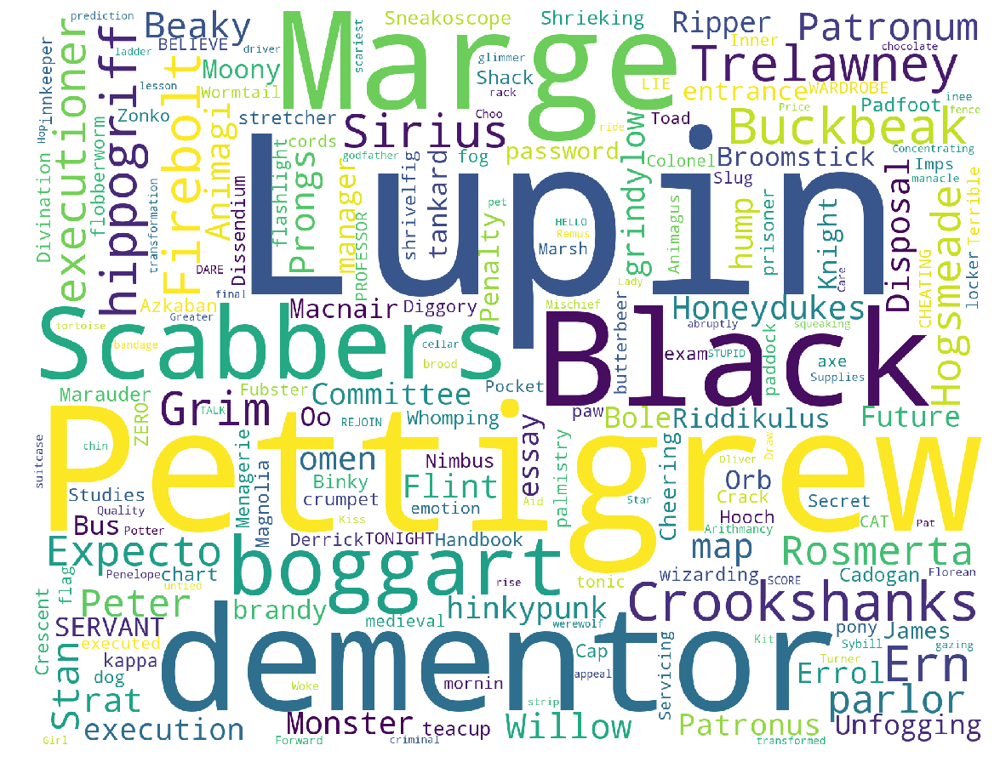

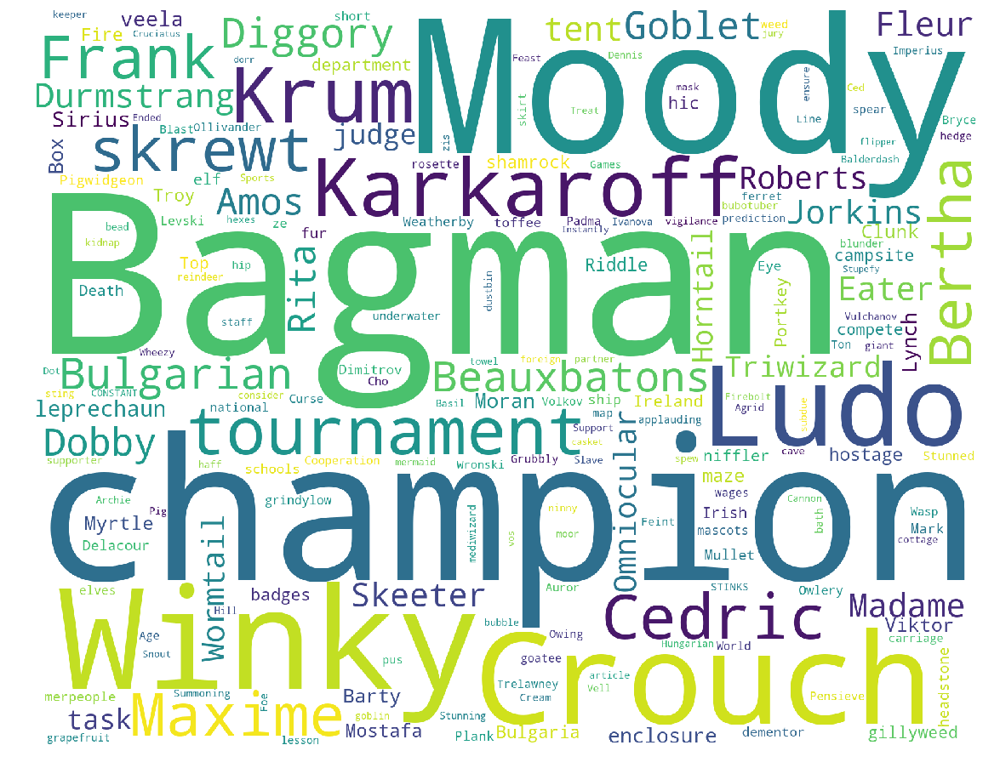

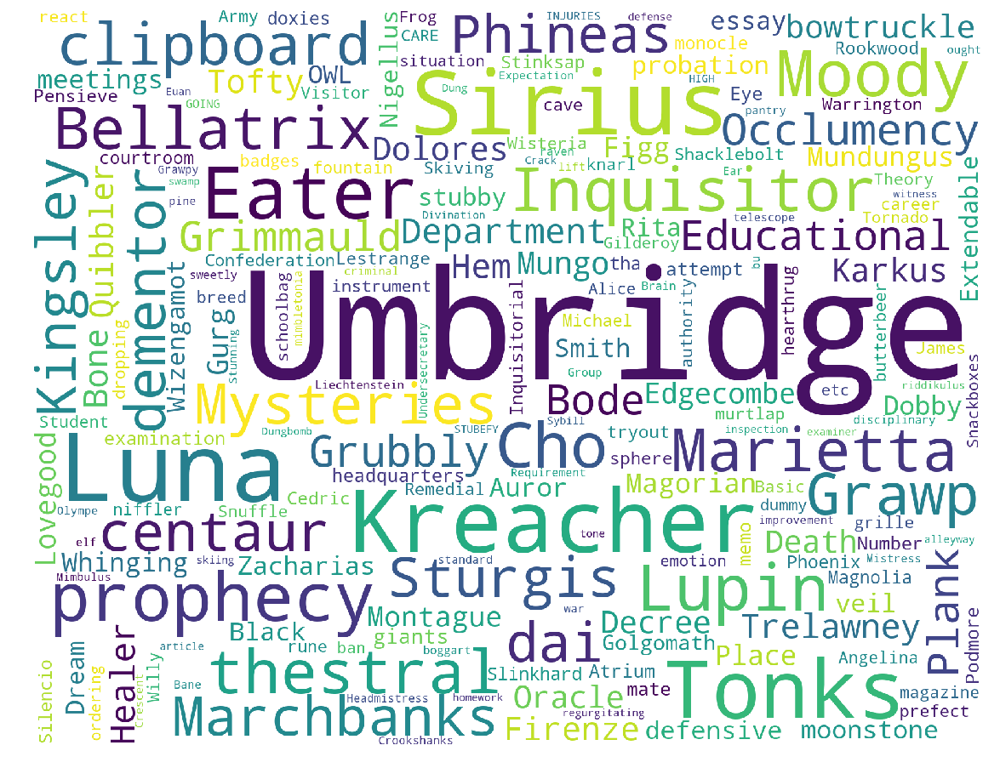

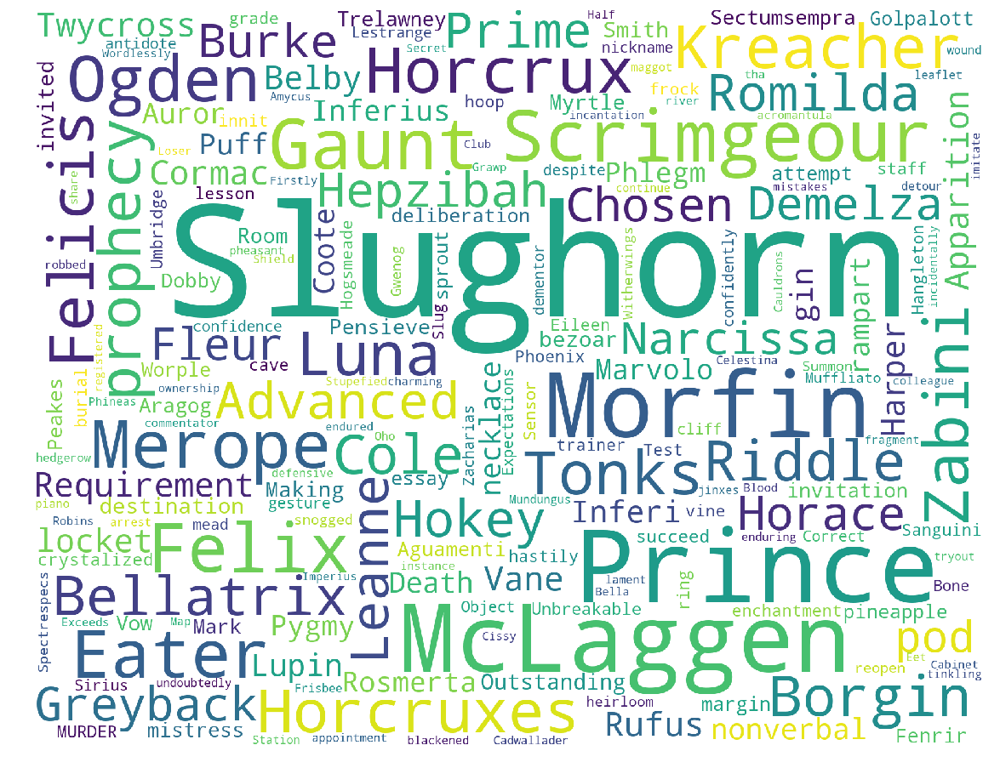

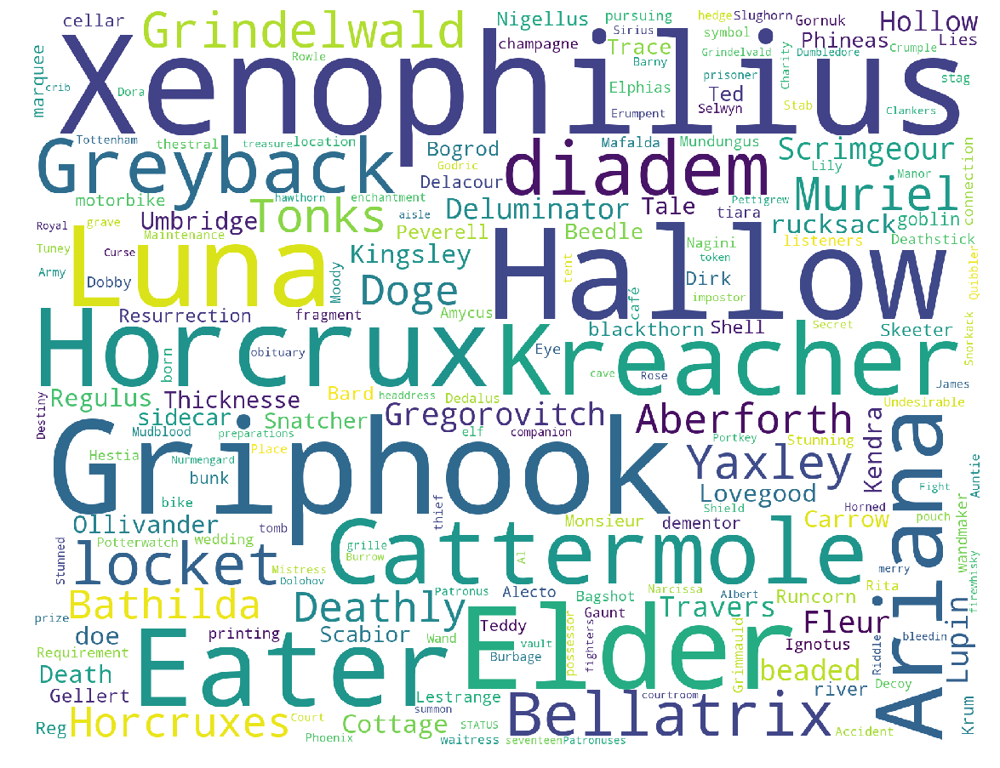

In [97]:
white = "#ffffff"
for index, j in enumerate(CL):
    display_cloud(j, white, stop_words=stop_words, title="book"+str(index+1))

In [98]:
#sentiment for dialog in the chapters chapters
def sentchap(chpX):
    senchp = []
    for chap in chpX:
        senchp.append(sentiment_dilog(dialog(chap)))
    return senchp

In [99]:
def remove_values_from_list(the_list, val):
    while val in the_list:
        the_list.remove(val)

In [100]:
def avesentchp(senchpX):
    senchp = []
    for i in senchpX:
        remove_values_from_list(i,0)
        senchp.append(np.mean(i))
    return senchp

In [101]:
#Sent of chapter according to dialog.
avesent = []
for books in chp:
    avesent.append(avesentchp(sentchap(books)))

C:\Users\Jan\Anaconda3\envs\socialGraphs\lib\site-packages\numpy\core\fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\Jan\Anaconda3\envs\socialGraphs\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [102]:
#sentiment of chapters
chapsent = []
for chap in chp:
    sentimen = []
    for each in chap:
        sentimen.append(sentiment(each))
    chapsent.append(sentimen)

In [119]:
def display_sentiment(x,y,labels, lable_locations, title="sent"):
    disp_color = "black"
    fig = plt.figure(figsize=(20,8))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.plot(x,y, color=ravenclaw)
    for book in lable_locations:
        plt.axvline(x=book, color="black")
    plt.xticks(lable_locations, labels,rotation=90, color= disp_color)
    plt.ylabel("Average Sentiment", color=disp_color)
    plt.tight_layout()
    plt.savefig("../plots/sentimants/" + title + ".png", format="PNG", transparent=True, bbox_inches="tight")

    plt.show

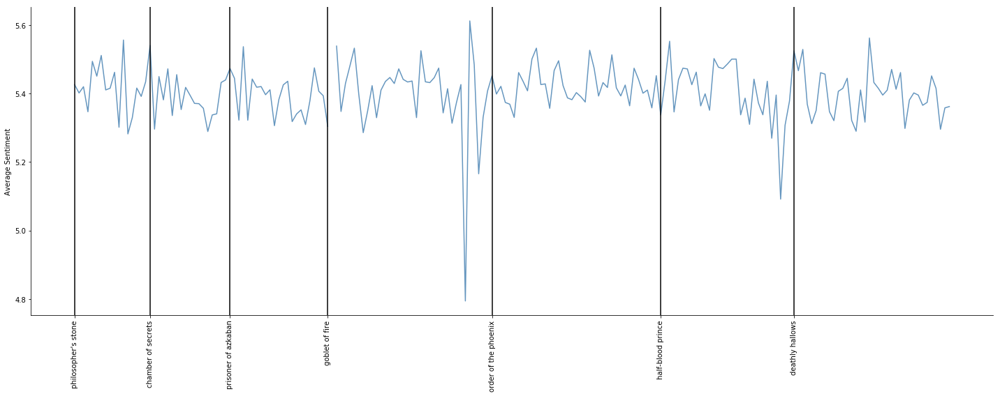

In [104]:
book_names = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows", 
]

y = []
book_start = []
for index, book_by_chapters  in enumerate(avesent):
    y += book_by_chapters
    if not book_start:
        book_start.append(0)
    else:
        book_start.append(book_start[index-1]+len(avesent[index-1]))
    
x_v = range(len(y))

display_sentiment(x_v,y,labels=book_names, lable_locations=book_start, title="sentChap")

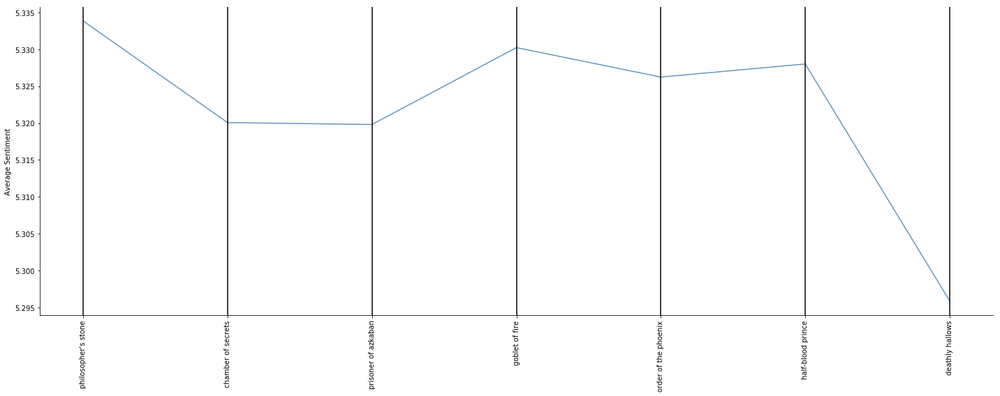

In [105]:
book_sentiments = [
    5.33385911817,
    5.32007207254,
    5.31981087567,
    5.33023696409,
    5.32624551042,
    5.3280163771,
    5.29587962731
]
x_2 = range(len(book_sentiments))
display_sentiment(x_2,book_sentiments, labels=book_names, lable_locations=x_2, title="sentBook")

In [106]:
book_sentiments

[5.33385911817,
 5.32007207254,
 5.31981087567,
 5.33023696409,
 5.32624551042,
 5.3280163771,
 5.29587962731]

In [107]:
for l in avesent:
    print(len(l))

17
18
22
37
38
30
36


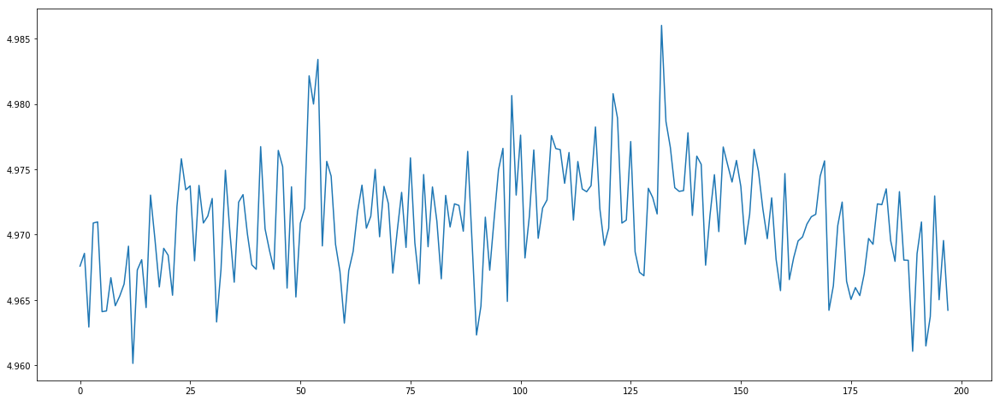

In [108]:
y = []
for book_by_chapters in chapsent:
    y += book_by_chapters
x = range(len(y))

fig = plt.figure(figsize=(20,8))
plt.plot(x,y)

In [109]:
text = nltk.Text(book[0]+book[1]+book[2]+book[3]+book[4]+book[5]+book[6])

In [110]:
from nltk.util import bigrams

In [111]:
def generate_collocations(tokens):
    '''
    Given list of tokens, return collocations.
    '''
    ignored_words = nltk.corpus.stopwords.words('english')
    bigram_measures = nltk.collocations.BigramAssocMeasures()

    # Best results with window_size, freq_filter of: (2,1) (2,2) (5,1)
    finder = nltk.collocations.BigramCollocationFinder.from_words(tokens, window_size = 2)
    finder.apply_word_filter(lambda w: len(w) < 3 or w.lower() in ignored_words)
    finder.apply_freq_filter(1)

    colls = finder.nbest(bigram_measures.likelihood_ratio, 100)

    return colls 

In [112]:
books = tokenize_list(book)
#books[6]

In [113]:
#generate_collocations(books[0])

In [114]:
files = [
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt",
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt",
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt",
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt",
    "HP5.txt",
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt",
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt",
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt" 
]

In [115]:
scenes = []
for script_name in files:
    with open("../movieScripts/" + script_name) as f:
        script = f.read()
        scenes.append(script.split("_START OF NEW SCENE_")[1:])

In [116]:
scenesent = []
for chap in scenes:
    sentim = []
    for each in chap:
        sentim.append(sentiment(each))
    scenesent.append(sentim)

In [120]:
def display_sentiment_scene(x,y,labels, lable_locations):
    disp_color = "black"
    fig = plt.figure(figsize=(20,8))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.plot(x,y, color=ravenclaw)
    for book in lable_locations:
        plt.axvline(x=book, color=disp_color)
    plt.ylim(4.8,5.1)
    plt.xticks(lable_locations, labels,rotation=90, color= disp_color)
    plt.ylabel("Average Sentiment", color=disp_color)
    plt.tight_layout()
    plt.savefig("../plots/sentimants/sentScenes.png", format="PNG", transparent=True, bbox_inches="tight")
    plt.show

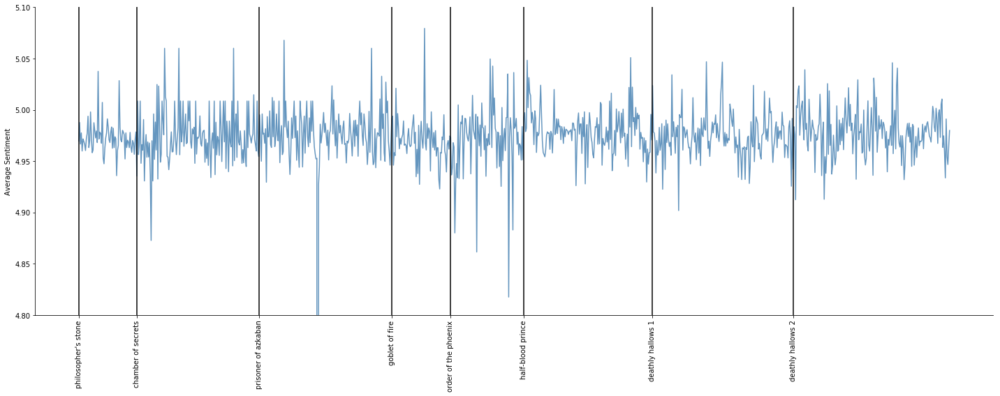

In [118]:
book_names = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"   
]
y = []
book_start = []
for index, book_by_chapters  in enumerate(scenesent):
    y += book_by_chapters
    if not book_start:
        book_start.append(0)
    else:
        book_start.append(book_start[index-1]+len(scenesent[index-1]))
    
x_v = range(len(y))

display_sentiment_scene(x_v,y,labels=book_names, lable_locations=book_start)

## Discussion

### What went well?

The website came out great and illustrate very well our different datas, so people can see and understand, what it is.
We manage to make a network dimension over time, where by showing a graph, could see how many characters appeared for each movie and their connection between each of them. A graph was made to show degree over time for each most important characters for each movies. Made movie network, that illustrate graphs, where the nodes are the characters and the edges is the connection between each character, if they have either appeared or mentioned in a scene together. We also detected which characters belongs to which houses, the muggles, other magical creatures and colored the nodes by that. We catched the different communities for each movie and showed the distribution of the knowing groups for each communities. By creating word clouds, we could show the most important and unique words for each book. And made a sentiment over the books, chapters, and scenes from the movies to show, what the overall mood of the Harry Potter Universe.



### What is still missing? What could be improved?, Why?

The initial idea for the networks  was to create both a network for the wiki page as well as networks for the movies and to contrast them, but because of some issues with the database dump - no apparent systematic way to identify all characters - the idea was put on hold in favor of the movie script networks, as generating networks from larger texts was a fresh problem compared to the wiki network which is closer related to the previous exercises. 
An interesting thing to do would be try utilize the information about which characters are talking in the scenes and which characters they are talking to and about to generate directed networks, but this is very difficult as the scripts are not uniform in their format and would require further clean up, likely manual.

We also didn’t fully realize our vision towards the book analysis. We wanted to take a closer look at collocations and see popular spells and objects as many of them are composed of two words (invisibility cloak, Wingardium Leviosa, flying car, etc.), but the character names were just too dominant and there wasn’t enough to clean the books in order to get more interesting results.

The sentiment analysis was similarly not as fruitful as hoped as the values all are pretty similar within the range of 5.6 and 4.8. 

The sentiment values used for the analysis were based on the dataset that was used for the twitter analysis of the congress tweets. Many words from the Harry Potter universe that are relevant for negative and positive sentiments are not included in that list and thus with more time a more domain specific sentiment dataset could have been created for more interesting results. There also wasn’t much time to take a closer look at the most interesting chapters that stood out in the sentiment and set them into context.
Finally, also because of time issues caused the issues in the data collection,  the overall analysis didn’t turn out as deep as intended and could be improved.

It was also challenging to present the illustrations structured and easy to overview because of the amount of networks and related graphs. The layout of the homepage could be improved to be more user friendly. 


 
 

